In [2]:
from transformers import AutoModelForCausalLM, AutoProcessor, GenerationConfig
from PIL import Image
import requests
import torch
import os
import matplotlib.pyplot as plt
import re

In [3]:
model_name = 'allenai/Molmo-7B-D-0924'

In [4]:
# load the processor
processor = AutoProcessor.from_pretrained(
    model_name,
    trust_remote_code=True,
    torch_dtype='auto',
    device_map='auto'
)

In [5]:
# load the model
model = AutoModelForCausalLM.from_pretrained(
    model_name,
    trust_remote_code=True,
    #torch_dtype='auto',
    torch_dtype=torch.float16,
    device_map='auto'
)


Loading checkpoint shards:   0%|          | 0/7 [00:00<?, ?it/s]

In [6]:
"""
Gibt zwei Arrays zurück, die jeweils die tasks (strings) bzw die Bilder enthalten.
Geht die Folder durch und liest die task aus lang.txt und das bild aus im_0
"""
def extract_tasks_and_images(path_to_directory):
    tasks = []
    images = []

    for experiment in os.listdir(path_to_directory):
        if experiment.startswith("."):
            continue
        subdir_path = os.path.join(path_to_directory, experiment)
        task_file_path = os.path.join(subdir_path, "lang.txt")

        # Get Task
        with open(task_file_path, "r") as lang_file:
            task = lang_file.read()
            tasks.append(task)

        # Get image
        for file in os.listdir(subdir_path):
                    if file.startswith("im_") and file.endswith((".png", ".jpg", ".jpeg")):
                        image_path = os.path.join(subdir_path, file)
                        image = Image.open(image_path)
                        images.append(image)

    return tasks, images        

In [7]:
import abc
class Model_output(abc.ABC):

    @abc.abstractmethod
    def get_labels():
        raise NotImplementedError 

    @abc.abstractmethod
    def get_coordinates():
        raise NotImplementedError

    @abc.abstractmethod
    def get_generated_text():
        raise NotImplementedError


class Molmo_out(Model_output):
    def __init__(self, model_output, log_likelihood, width, height):
        self.labels= []
        self.coordinates = []
        self.generated_text = model_output
        self.log_likelihood = log_likelihood

        
        #Find pattern: (object-name, (x, y))
        #(x1, y1), (x2, y2), (x3, y3), ... 
        pattern = r"\(([^,]+), ([^\)]+)\)"

        #(obj1, (x1, y1)), (obj2, (x2, y2)), (obj3, (x3, y3)), ...
        #pattern = r'\(([^,]+),\s*\((\d+\.?\d*),\s*(\d+\.?\d*)\)\)'
        matches = re.findall(pattern, model_output)
        
        objects = []

        modified_matches = [("", float(x), float(y)) for x, y in matches]
        for object_label, x, y in modified_matches:
            self.labels.append(object_label.strip())
            self.coordinates.append(self._scale_coordinates(x, y, width, height))


    def _scale_coordinates(self, x, y, width, height):
        scaled_x = float(x) / 100 * width
        scaled_y = float(y) / 100 * height
        return (int(scaled_x), int(scaled_y))

    def get_labels(self):
        return self.labels

    def get_coordinates(self):
        return self.coordinates

    def get_generated_text(self):
        return self.generated_text

    def get_log_likelihood(self):
        return self.log_likelihood

In [16]:
"""
Nimmt die Objekte und visualisiert diese auf dem image.
labels ist ein Array, der die jeweiligen labels sind, die dann angezeigt werden (Also Prompt: 1, Prompt: 2, ... oder Temp: 1, Temp: 2, ...)
sets_of_objects is ein Array, der Listen enthält, welche die Objekte speichern. Also jede Liste ist ein run mit dem Model (Hier werden ja immer mehrere Punkte ausgegeben, deshalb ist ein run selbst auch eine Liste)
Und weil wir ja bspw. alle temperatures, oder alle prompts in einer Grafik haben wollen, müssen die halt alle jeweils nochmal in einer Liste zusammengefasst werden
"""
def visualize_points_on_image(image, labels, model_outs):
    plt.imshow(image, alpha=1.0)
    colors = ['red', 'blue']
    labels = ["Object to move", "Where to place"]

    # Create two separate lists for alternating the colors
    group1_x = []
    group1_y = []
    group2_x = []
    group2_y = []

    # Iterate over model outputs and labels
    for i, output in enumerate(model_outs):
        coordinates = output.get_coordinates()
        
        # Alternate between color1 (red) and color2 (blue)
        for j, coordinate in enumerate(coordinates):
            if j % 2 == 0:
                group1_x.append(coordinate[0])
                group1_y.append(coordinate[1])
            else:
                group2_x.append(coordinate[0])
                group2_y.append(coordinate[1])

    # Plot points with alternating colors
    plt.scatter(group1_x, group1_y, marker='o', color='red', label=labels[0])
    plt.scatter(group2_x, group2_y, marker='o', color='blue', label=labels[1])

    
    # Add labels and show the plot
    plt.title("Coordinates on Image")
    plt.legend(loc="lower right")
    plt.axis("on")  # Show axes
    plt.show()
    plt.close()

In [9]:
"""
Hier sind die prompts für die VLM. Der Anfang und das Ender sind immer identisch und die Task wird im Skript später automatisch eingesetzt.
Die verschiedenen Prompts können dann über die Liste ausgewählt werden.
"""
#"Locate several points within the vacant space for the following task: " + task + "Your answer should be formatted as a list of tuples, i.e. [(x1, y1), (x2, y2), ...], where each tuple contains the x and y coordinates of a point satisfying the conditions above. The coordinates should be between 0 and 1, indicating the normalized pixel locations of the points in the image."

prompt_start = "You are the robot in the picture. Your task is to: "

prompts = []
prompt_1 = " To complete this task, do two things. 1. Find the relevant object and point to it. 2. If your task somehow includes moving or putting the object somewhere in the image point to that location."
prompt_2 = " To complete this task, do two things. 1. Find the relevant object and point to it. 2. If your task somehow includes moving or putting the object somewhere in the image point to that location. If you dont have to move the object to another location in the image, use 0.0 as x2 and 0.0 as y2."
prompt_3 = " To complete this task, find the relevant object that you have to move and the place to move it to. Point to these."
prompt_4 = " To complete this task, find the relevant object that you have to move and the place to move it to. If you are not tasked to move and object use (0, 0) for the place to move it to. Pinpoint these. "
prompt_5 = " To complete this task, find the relevant object that you have to move and the location to move it to. Point to these."
#prompt_1 = "First, create a plan how to execute the task. Afterwards, find the relevant objects from your plan in the picture and point to them as well as the robot arm, if that is in the picture."
#prompt_2 = "To complete this taks, First create a plan to execute the task. Afterwards find the relevant objects for the task. Then point to the relevant objects in the picture, as well as the robot arm if that is in the picture."
#robo_point_prompt = "Locate several points within the vacant space for the following task: "
#prompt_3 = "To complete this taks, first find the relevant objects from the task. Reason, why you need them to complete the task. Then pinpoint the relevant objects in the picture, as well as the robot arm."
#prompt_4 = "To complete this task, first find the relevant objects in the picture. Afterwards create a plan to execute the task."
#prompt_4 = "Find objects, that are not relevant for completing this task."

prompts = [prompt_1, prompt_2, prompt_3]
#prompts = [prompt_1, prompt_2, prompt_3, prompt_4]
#robo_point_end = "Your answer should be formatted as a list of tuples, i.e. [(x1, y1), (x2, y2), ...], where each tuple contains the x and y coordinates of a point satisfying the conditions above. The coordinates should be between 0 and 1, indicating the normalized pixel locations of the points in the image."
#prompt_end = " Your output format should be like this: (name of object 1, (x1, y1)), (name of object 2, (x2, y2)), ..., with x and y beeing integer values. Dont output anything else."
prompt_end = " Your output format should be like this: (x1, y1), (x2, y2), with (x1, y1) beeing the coordinates of the object to move and (x2, y2) the place to move it to. Dont output anything else."

In [10]:
temperatures = [0.3, 0.4, 0.6, 0.7]

In [11]:
import numpy as np

def plot_euclidean_bplot(outputs):
    labels = ["Object to move", "Where to place"]
    #TODO - Implement groud_truthes - In the moment just the first run
    ground_truth_coordinates = outputs[0].get_coordinates()
    #TODO - IN the moment just hardcoded to two plots. The object to move and the place to put it at
    data = []
    for i in range(2):
        distances = []
        ground_truth = ground_truth_coordinates[i]
        for run in outputs:
            point = run.get_coordinates()[i]
            euc_dist = np.sqrt(np.square(ground_truth[0] - point[0]) + np.square(ground_truth[1] - point[1]))
            distances.append(euc_dist)
        data.append(distances)

    # Create the boxplots side by side
    plt.boxplot(data, positions=[1, 2], widths=0.6)
    plt.xticks([1, 2], labels)  # Set x-axis labels
    plt.ylabel('Euclidean distance from ground truth')
    plt.title('Euclidean Distance Boxplots')
    plt.show()

In [12]:
def plot_loglikelihood_bplot(outputs, label):
    log_likelihoods = []
    for run in outputs:
        ll = run.get_log_likelihood()
        log_likelihoods.append(ll)

    # Create the boxplots side by side
    plt.boxplot(log_likelihoods)
    plt.xlabel(label)  # Set x-axis label
    plt.ylabel('Log-Likelihood')
    plt.title('')
    plt.show()

In [13]:
from torch.nn.functional import log_softmax
def infer_output_and_log_likelihood(image, prompt, temperature=0.2):
    # Process inputs
    inputs = processor.process(
        images=image,
        text=prompt
    )
    inputs = {k: v.to(model.device).unsqueeze(0) for k, v in inputs.items()}

    # Generate output and compute logits
    with torch.autocast(device_type="cuda", enabled=True, dtype=torch.bfloat16):
        # Generate output
        output = model.generate_from_batch(
            inputs,
            GenerationConfig(max_new_tokens=200, stop_strings="<|endoftext|>", temperature=temperature, do_sample=True),
            tokenizer=processor.tokenizer,
            return_dict_in_generate=True,
            output_logits=True
        )
        #print(f"All Token length: {len(output.sequences)}")
        #print(f"Logit length: {len(output.logits[0])}, {len(output.logits[1])}, {len(output.logits[2])}")

        output_text = generate_output_text(output, inputs)
        log_likelihood = generate_log_likelihood(output)

    return output_text, log_likelihood

In [14]:
def generate_output_text(output, inputs):
    # Access generated sequences
    generated_tokens = output.sequences[0, inputs['input_ids'].size(1):]
    #print(f"Output Token length: {len(generated_tokens)}")
    #print(f"Tokens: {generated_tokens}")
    # Decode the generated tokens
    generated_text = processor.tokenizer.decode(generated_tokens, skip_special_tokens=True)
    return generated_text


def generate_log_likelihood(output):
    logits = output.logits # Shape: [batch_size, seq_len, vocab_size]

    #generated_logits = torch.stack(generated_logits)
    generated_logits = torch.cat(logits, dim=0)
    #print(f"used logits: {len(generated_logits)}")
    softmax_fn = torch.nn.Softmax(dim=-1)

    logit_probs = softmax_fn(generated_logits)
    highest_probs, _ = torch.max(logit_probs, dim=-1)
    output_log_probs = torch.log(highest_probs)
    log_likelihood = torch.sum(output_log_probs)
    

    return log_likelihood.item()

# Experiments

In [2]:
import sys
from pathlib import Path
parent_dir = Path.cwd().parent
sys.path.append(str(parent_dir))

from molmo_utils import load_model, do_inference, get_coordinates, refactor_coordinates_to_where_to_place
from utils import extract_all, visualize_points_on_image, plot_euclidean_bplot

In [3]:
model_name = 'allenai/Molmo-7B-D-0924'
model, processor = load_model(model_name)

Loading checkpoint shards:   0%|          | 0/7 [00:00<?, ?it/s]

Task: Move the can from the top left of the burner to the bottom left of the burner
Run: 5 - Output:  (27.7, 28.1), (27.7, 42.4)
Run: 10 - Output:  (26.9, 28.3), (27.1, 50.2)
Run: 15 - Output:  (26.9, 27.0), (26.9, 52.2)
Run: 20 - Output:  (27.5, 27.5), (27.5, 50.0)
Run: 25 - Output:  (27.6, 27.9), (28.2, 51.6)
Run: 30 - Output:  (26.9, 27.3), (27.3, 50.4)
Run: 35 - Output:  (27.1, 28.2), (27.1, 28.2)
Run: 40 - Output:  (27.5, 28.0), (27.5, 28.0)
Run: 45 - Output:  (27.7, 27.4), (27.7, 50.2)
Run: 50 - Output:  (27.4, 26.3), (27.4, 50.9)


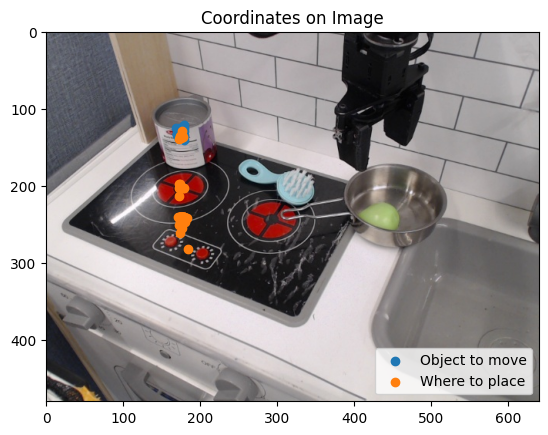

Runs with exactly two coordinates: 50


Task: pick up red srewdriver
Run: 5 - Output:  (45.6, 39.2), (70.1, 47.6)
Run: 10 - Output:  (29.4, 35.0), (50.0, 50.0)
Run: 15 - Output:  (49.8, 38.7), (50.0, 44.8), (50.0, 50.0), (50.0, 55.0), (50.0, 63.7), (50.0, 68.8), (50.0, 74.3), (50.0, 80.0), (50.0, 85.8), (50.0, 91.0), (50.0, 96.8), (50.1, 33.8), (50.1, 35.8), (50.1, 40.0), (50.1, 42.0), (50.1, 46.8), (50.1, 5
Run: 20 - Output:  (25.2, 37.8), (50.0, 50.0)
Run: 25 - Output:  (40.2, 39.0), (50.0, 45.2)
Run: 30 - Output:  (43.2, 39.3), (50.8, 33.4)
Run: 35 - Output:  (35.0, 39.9), (50.0, 35.0)
Run: 40 - Output:  (20.8, 30.3), (50.0, 50.0)
Run: 45 - Output:  (22.8, 31.6), (55.0, 47.1)
Run: 50 - Output:  (45.2, 39.3), (50.0, 45.2)


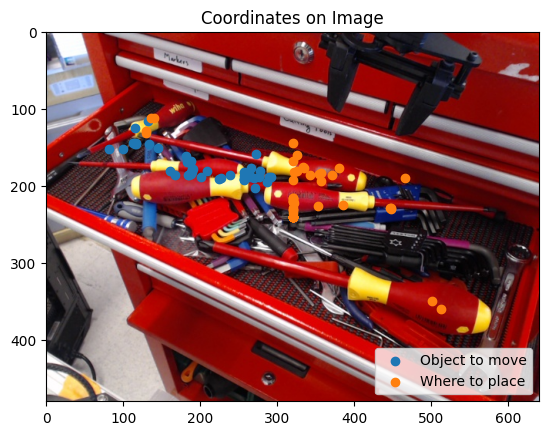

Runs with exactly two coordinates: 48


Task: take the broccoli and put it between the two right burners
Run: 5 - Output:  (44.0, 41.3), (59.5, 50.0)
Run: 10 - Output:  (44.9, 41.5), (59.6, 50.1)
Run: 15 - Output:  (45.0, 42.2), (59.5, 50.2)
Run: 20 - Output:  (45.0, 42.4), (59.9, 49.8)
Run: 25 - Output:  (44.3, 42.5), (59.6, 50.0)
Run: 30 - Output:  (44.7, 41.3), (59.3, 50.4)
Run: 35 - Output:  (46.5, 41.0), (59.2, 50.2)
Run: 40 - Output:  (45.7, 42.6), (59.9, 50.2)
Run: 45 - Output:  (46.9, 42.0), (59.4, 49.2)
Run: 50 - Output:  (44.5, 41.0), (59.6, 50.8)


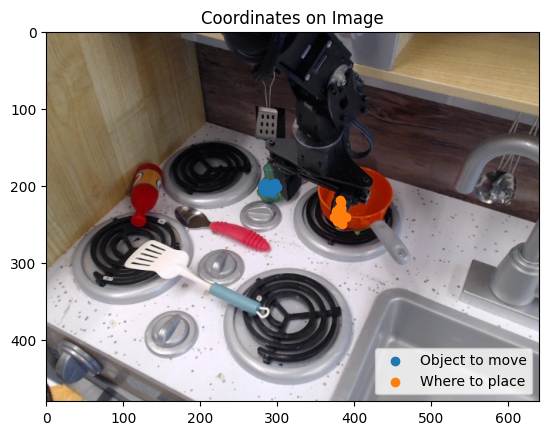

Runs with exactly two coordinates: 50


Task: move arch on the table and place it on top of another arch


In [ ]:
prompt_start = "You are the robot in the picture. Your task is to: "
prompt_1 = " To complete this task, do two things. 1. Find the relevant object and point to it. 2. If your task somehow includes moving or putting the object somewhere in the image point to that location."
prompt_end = " Your output format should be like this: (x1, y1), (x2, y2), with (x1, y1) beeing the coordinates of the object to move and (x2, y2) the place to move it to. Dont output anything else."

tasks, images, ground_truths, _ = extract_all("../data")

for i in range(len(tasks)):
    outputs = []
    runs_with_two_coords = 0
    image = images[i]
    image_width = image.width
    image_height = image.height
    task = tasks[i]
    prompt = prompt_start + task + prompt_1 + prompt_end

    print(f"Task: {task}")
    for j in range(50):
        output = do_inference(image, prompt, model, processor)
        coordinates = get_coordinates(output, image_width, image_height)
        if len(coordinates) == 2:
            runs_with_two_coords += 1
            outputs.append(coordinates)

        if ((j+1) % 5) == 0: 
            print(f"Run: {j + 1} - Output: {output}")

    labels = ["Object to move", "Where to place"]

    outputs = refactor_coordinates_to_where_to_place(outputs)
    visualize_points_on_image(image, labels, outputs)
    print(f"Runs with exactly two coordinates: {runs_with_two_coords}")
    print("")
    print("")

Task: Move the can from the top left of the burner to the bottom left of the burner
Run: 5 - Output:  (26.8, 26.1), (27.0, 50.5) - Log-Likelihood: -13.820358276367188
Run: 10 - Output:  (26.9, 27.3), (27.3, 50.0) - Log-Likelihood: -13.659281730651855
Run: 15 - Output:  (27.5, 27.3), (28.0, 50.0) - Log-Likelihood: -14.086633682250977
Run: 20 - Output:  (27.2, 28.0), (27.2, 28.0) - Log-Likelihood: -10.850940704345703
Run: 25 - Output:  (27.6, 28.4), (27.6, 50.0) - Log-Likelihood: -12.882763862609863
Run: 30 - Output:  (26.8, 28.0), (27.1, 42.3) - Log-Likelihood: -15.22599983215332
Run: 35 - Output:  (27.4, 26.7), (27.4, 50.0) - Log-Likelihood: -12.564002990722656
Run: 40 - Output:  (27.0, 26.8), (27.0, 50.0) - Log-Likelihood: -12.612065315246582
Run: 45 - Output:  (27.5, 27.7), (28.0, 50.0) - Log-Likelihood: -14.032108306884766
Run: 50 - Output:  (27.5, 25.9), (27.5, 25.9) - Log-Likelihood: -11.43773078918457


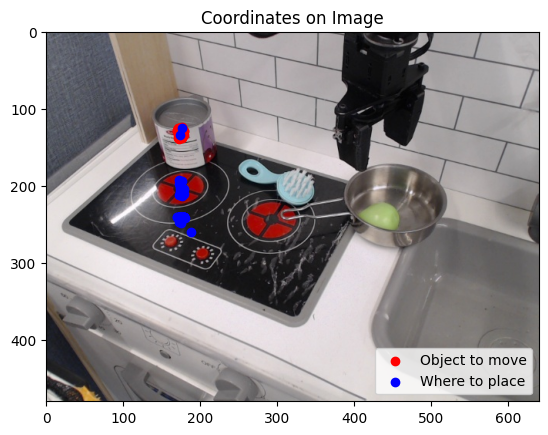

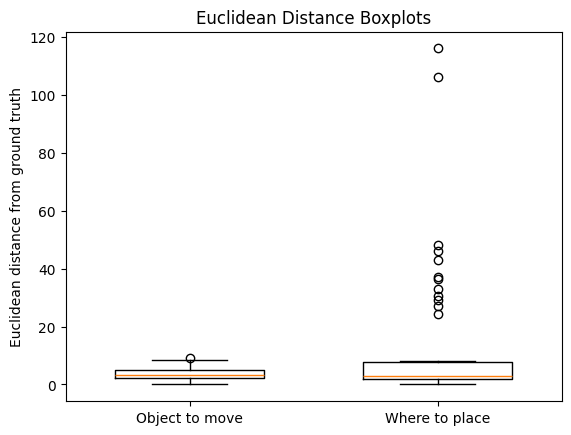

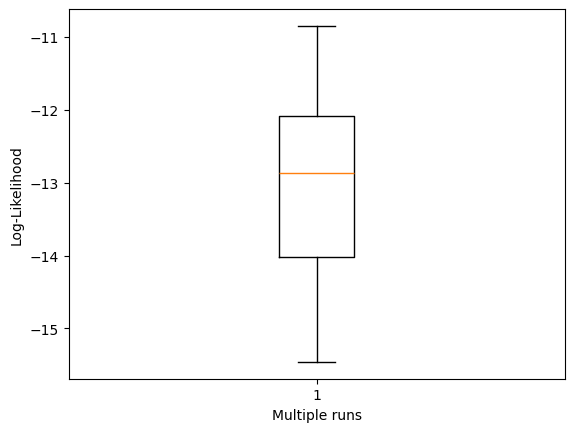

Runs with exactly two coordinates: 50


Task: pick up red srewdriver
Run: 5 - Output:  (44.1, 41.5), (50.0, 50.0) - Log-Likelihood: -16.68979263305664
Run: 10 - Output:  (28.4, 33.0), (59.7, 21.8) - Log-Likelihood: -21.57404327392578
Run: 15 - Output:  (44.1, 39.0), (70.4, 48.3) - Log-Likelihood: -21.269550323486328
Run: 20 - Output:  (15.4, 32.3), (72.0, 59.3) - Log-Likelihood: -21.83251953125
Run: 25 - Output:  (19.5, 23.9), (70.4, 39.3) - Log-Likelihood: -20.934463500976562
Run: 30 - Output:  (36.1, 38.5), (50.0, 45.0) - Log-Likelihood: -20.218645095825195
Run: 35 - Output:  (28.3, 37.8), (50.0, 50.0) - Log-Likelihood: -16.322303771972656
Run: 40 - Output:  (25.7, 37.9), (50.0, 49.8) - Log-Likelihood: -19.666000366210938
Run: 45 - Output:  (39.4, 39.3), (41.7, 37.0), (43.0, 35.0), (45.5, 33.1), (47.6, 31.5), (50.0, 29.5), (52.5, 27.6), (55.0, 25.9), (57.0, 24.2), (59.0, 22.5), (61.5, 21.0), (64.0, 19.6), (66.5, 18.2), (69.0, 16.9), (71.5, 15.5), (74.0, 14.2), (76.5, 1 - Log-Likeliho

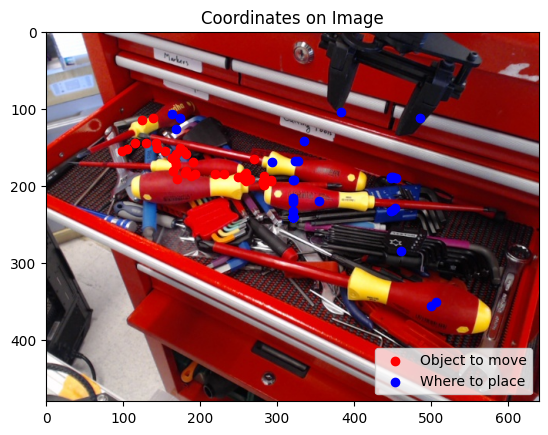

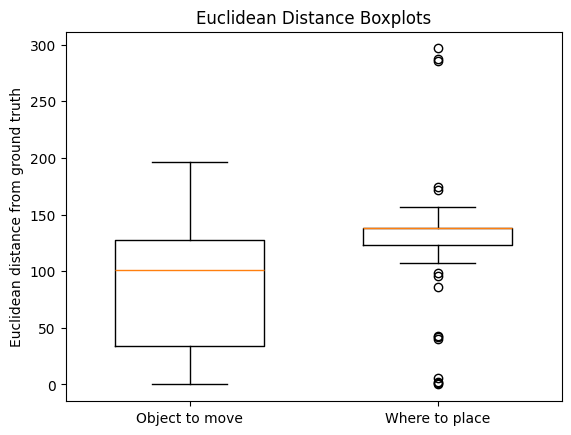

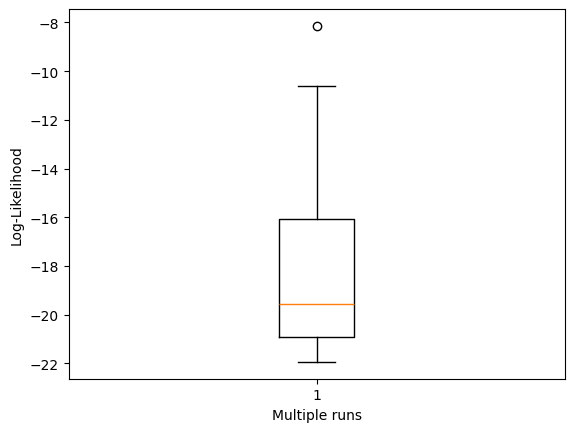

Runs with exactly two coordinates: 46


Task: take the eggplant and put it between the two right burners
Run: 5 - Output:  (44.1, 42.0), (59.4, 50.2) - Log-Likelihood: -16.933195114135742
Run: 10 - Output:  (59.0, 45.6), (62.1, 50.7) - Log-Likelihood: -17.834545135498047
Run: 15 - Output:  (59.7, 46.9), (59.7, 51.0) - Log-Likelihood: -14.202400207519531
Run: 20 - Output:  (58.1, 44.6), (61.6, 51.5) - Log-Likelihood: -17.72557830810547
Run: 25 - Output:  (58.9, 45.1), (63.9, 50.8) - Log-Likelihood: -17.97455596923828
Run: 30 - Output:  (59.8, 45.6), (60.2, 52.2) - Log-Likelihood: -17.38101577758789
Run: 35 - Output:  (57.1, 46.1), (59.7, 50.6) - Log-Likelihood: -16.819110870361328
Run: 40 - Output:  (55.8, 48.5), (63.9, 54.6) - Log-Likelihood: -18.233600616455078
Run: 45 - Output:  (49.3, 41.5), (59.5, 50.1) - Log-Likelihood: -16.178316116333008
Run: 50 - Output:  (59.5, 47.4), (59.5, 53.5) - Log-Likelihood: -14.59671688079834


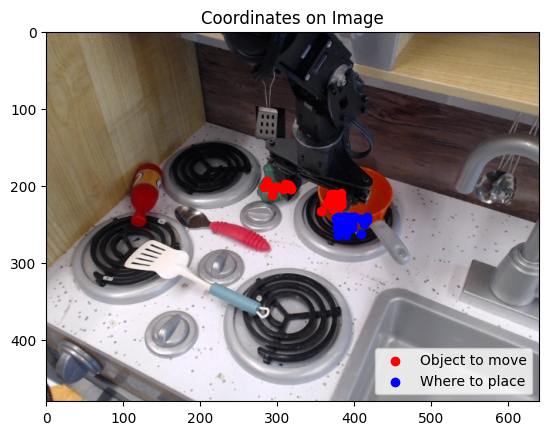

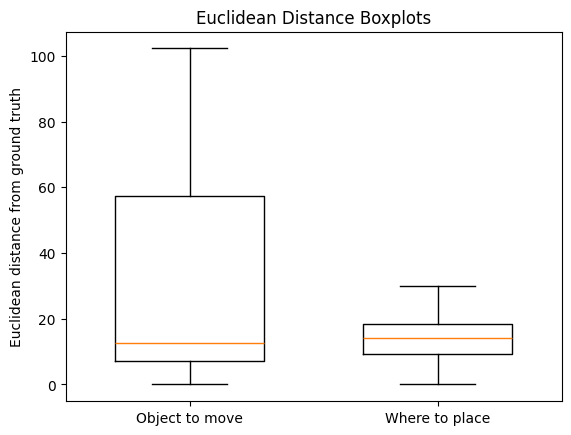

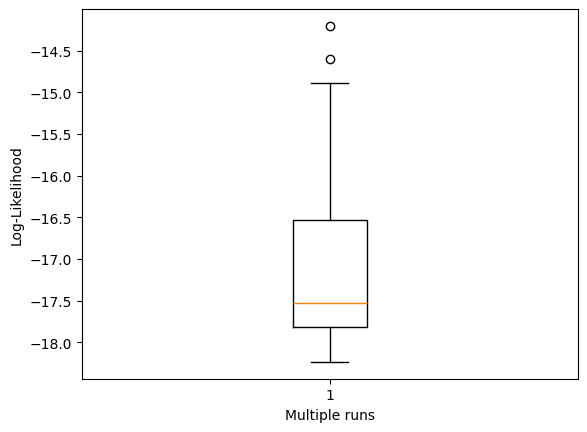

Runs with exactly two coordinates: 50


Task: move arch on the table and place it on top of another arch
Run: 5 - Output:  (40.8, 72.0), (69.6, 76.7) - Log-Likelihood: -18.114582061767578
Run: 10 - Output:  (40.8, 72.9), (70.0, 73.7) - Log-Likelihood: -18.57257843017578
Run: 15 - Output:  (41.2, 72.2), (69.9, 78.2) - Log-Likelihood: -17.760787963867188
Run: 20 - Output:  (40.8, 69.5), (69.5, 76.1) - Log-Likelihood: -17.19489097595215
Run: 25 - Output:  (40.9, 72.8), (68.8, 77.1) - Log-Likelihood: -17.726299285888672
Run: 30 - Output:  (41.0, 74.3), (69.6, 78.0) - Log-Likelihood: -17.53959083557129
Run: 35 - Output:  (40.1, 74.1), (42.0, 63.3) - Log-Likelihood: -18.357173919677734
Run: 40 - Output:  (41.8, 74.0), (69.5, 76.3) - Log-Likelihood: -17.624958038330078
Run: 45 - Output:  (69.8, 78.3), (45.6, 60.3) - Log-Likelihood: -17.513084411621094
Run: 50 - Output:  (40.5, 72.6), (69.8, 77.0) - Log-Likelihood: -18.13563346862793


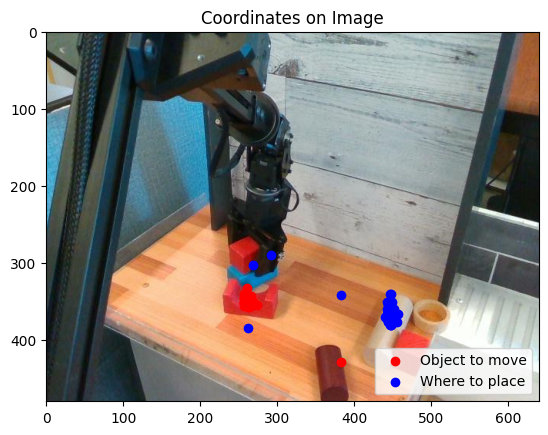

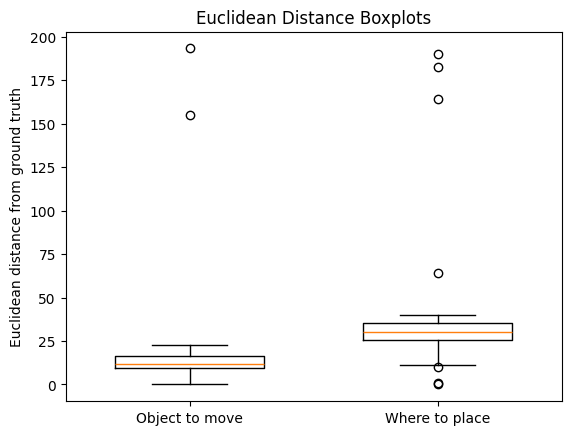

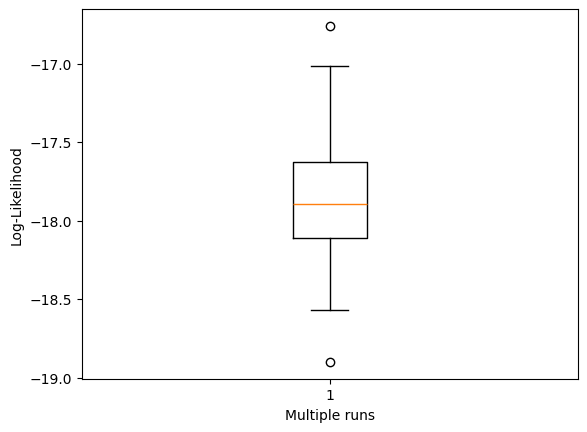

Runs with exactly two coordinates: 50


Task: take sushi out of pan
Run: 5 - Output:  (31.7, 23.3), (33.5, 20.2) - Log-Likelihood: -17.122661590576172
Run: 10 - Output:  (30.5, 24.2), (30.5, 29.7) - Log-Likelihood: -14.838939666748047
Run: 15 - Output:  (31.3, 23.2), (31.3, 27.1) - Log-Likelihood: -15.033380508422852
Run: 20 - Output:  (31.0, 23.2), (34.5, 23.2) - Log-Likelihood: -14.826705932617188
Run: 25 - Output:  (32.4, 23.1), (32.4, 27.1) - Log-Likelihood: -15.183614730834961
Run: 30 - Output:  (31.3, 23.4), (37.0, 59.8) - Log-Likelihood: -16.09278106689453
Run: 35 - Output:  (31.2, 22.8), (31.2, 25.0), (32.4, 20.8), (33.0, 23.6), (33.2, 26.0), (34.6, 21.3), (35.0, 24.3), (35.8, 26.5), (36.4, 22.8), (37.1, 25.5), (37.9, 27.4), (38.5, 24.0), (39.4, 26.5), (40.1, 28.1), (40.8, 24.9), (41.6, 27.4), (42.4, 2 - Log-Likelihood: -94.64007568359375
Run: 40 - Output:  (31.7, 23.2), (32.5, 19.3) - Log-Likelihood: -16.63730812072754
Run: 45 - Output:  (31.3, 24.3), (31.3, 25.1) - Log-Likeli

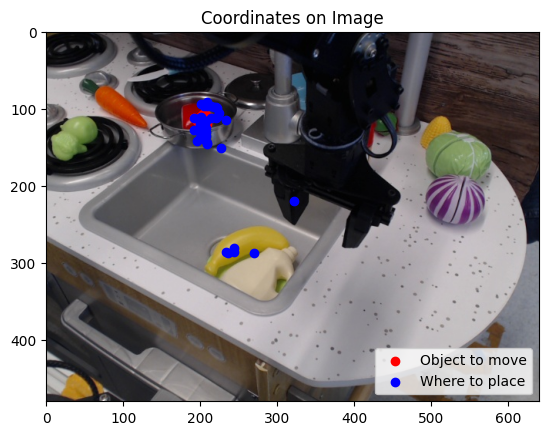

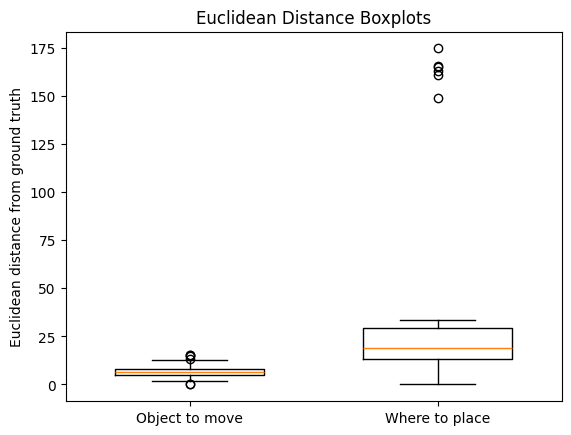

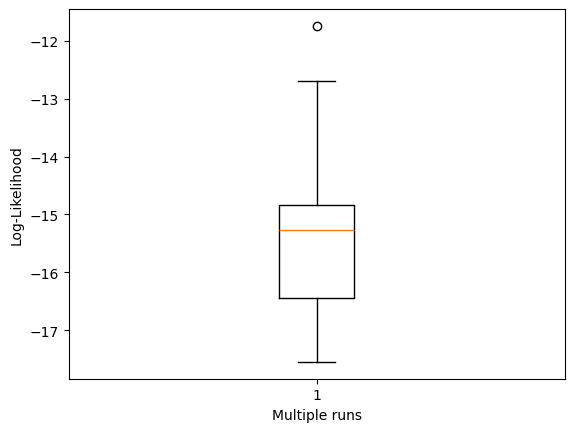

Runs with exactly two coordinates: 45


Task: pick up glass cup
Run: 5 - Output:  (40.1, 59.3), (50.2, 39.9) - Log-Likelihood: -16.792369842529297
Run: 10 - Output:  (40.5, 58.2), (50.0, 40.5) - Log-Likelihood: -15.556427001953125
Run: 15 - Output:  (41.0, 59.4), (50.1, 39.5) - Log-Likelihood: -16.764509201049805
Run: 20 - Output:  (41.0, 59.4), (50.4, 39.3) - Log-Likelihood: -16.759273529052734
Run: 25 - Output:  (41.5, 59.4), (54.7, 39.5) - Log-Likelihood: -17.123476028442383
Run: 30 - Output:  (41.0, 60.5), (51.2, 41.5) - Log-Likelihood: -17.026302337646484
Run: 35 - Output:  (41.2, 59.4), (50.2, 40.5) - Log-Likelihood: -17.058910369873047
Run: 40 - Output:  (40.5, 62.0), (50.0, 40.5) - Log-Likelihood: -15.579948425292969
Run: 45 - Output:  (40.5, 59.2), (50.0, 40.5) - Log-Likelihood: -15.515636444091797
Run: 50 - Output:  (41.0, 59.4), (53.9, 38.2) - Log-Likelihood: -16.89112091064453


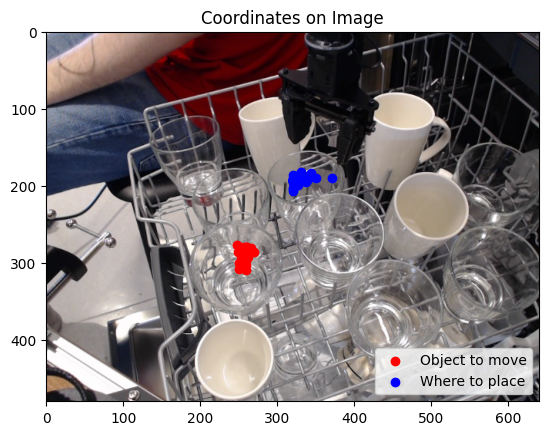

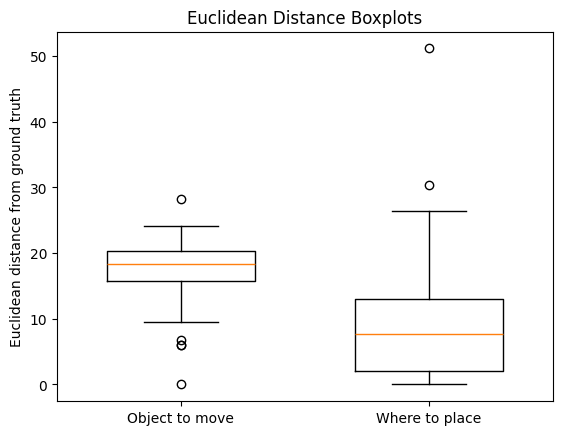

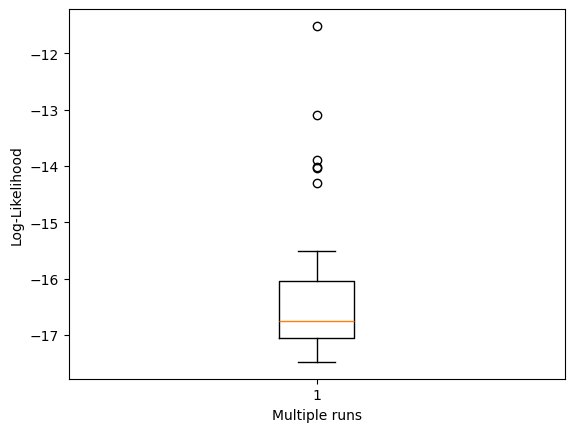

Runs with exactly two coordinates: 50


Task: open low fridge
Run: 5 - Output:  (58.8, 61.7), (59.6, 52.2) - Log-Likelihood: -18.383848190307617
Run: 10 - Output:  (59.4, 62.0), (59.4, 62.0) - Log-Likelihood: -14.12877082824707
Run: 15 - Output:  (59.6, 61.2), (59.6, 78.4) - Log-Likelihood: -16.7021427154541
Run: 20 - Output:  (60.1, 61.0), (50.0, 50.0) - Log-Likelihood: -12.150634765625
Run: 25 - Output:  (59.7, 58.7), (46.2, 40.0) - Log-Likelihood: -19.67357635498047
Run: 30 - Output:  (58.0, 59.6), (58.0, 78.6) - Log-Likelihood: -17.19902801513672
Run: 35 - Output:  (57.9, 62.5), (58.1, 43.8) - Log-Likelihood: -18.96255874633789
Run: 40 - Output:  (58.0, 64.3), (58.0, 80.0) - Log-Likelihood: -16.527048110961914
Run: 45 - Output:  (60.5, 60.5), (50.0, 50.0) - Log-Likelihood: -10.996421813964844
Run: 50 - Output:  (59.5, 61.5), (59.5, 51.2) - Log-Likelihood: -16.802017211914062


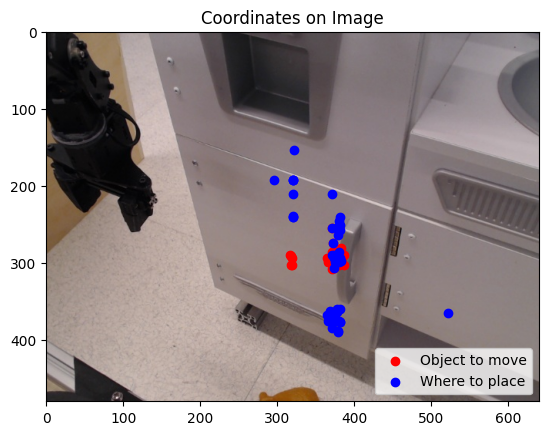

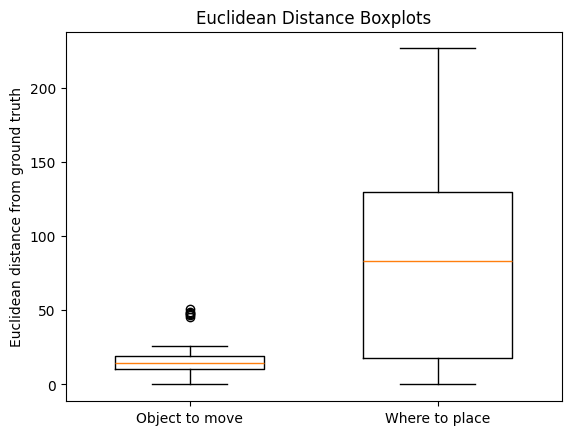

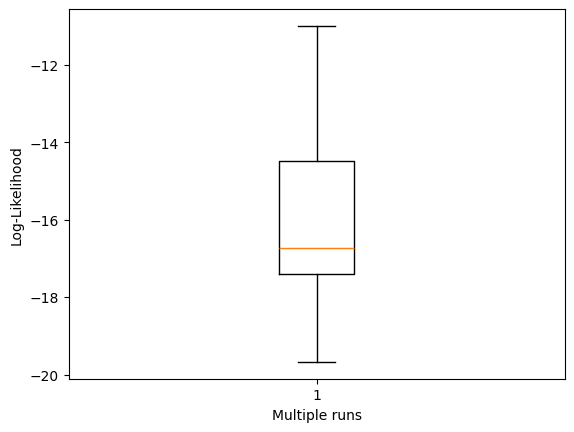

Runs with exactly two coordinates: 50


Task: Place the pot to the right of the blue fork.
Move silver pot to lower right corner of the table.
Run: 5 - Output:  (44.6, 32.7), (84.4, 65.8) - Log-Likelihood: -17.851226806640625
Run: 10 - Output:  (43.9, 31.3), (83.3, 63.5) - Log-Likelihood: -17.805164337158203
Run: 15 - Output:  (45.4, 33.1), (88.9, 68.8) - Log-Likelihood: -18.128910064697266
Run: 20 - Output:  (44.5, 33.9), (83.2, 62.4) - Log-Likelihood: -17.562381744384766
Run: 25 - Output:  (44.5, 33.3), (85.3, 60.0) - Log-Likelihood: -17.597335815429688
Run: 30 - Output:  (45.4, 31.0), (82.0, 61.6) - Log-Likelihood: -17.678802490234375
Run: 35 - Output:  (46.5, 33.1), (81.8, 61.0) - Log-Likelihood: -17.42770767211914
Run: 40 - Output:  (45.2, 32.3), (88.1, 68.9) - Log-Likelihood: -18.34717559814453
Run: 45 - Output:  (45.4, 32.3), (81.0, 65.9) - Log-Likelihood: -17.658153533935547
Run: 50 - Output:  (45.1, 33.8), (86.5, 60.7) - Log-Likelihood: -17.497711181640625


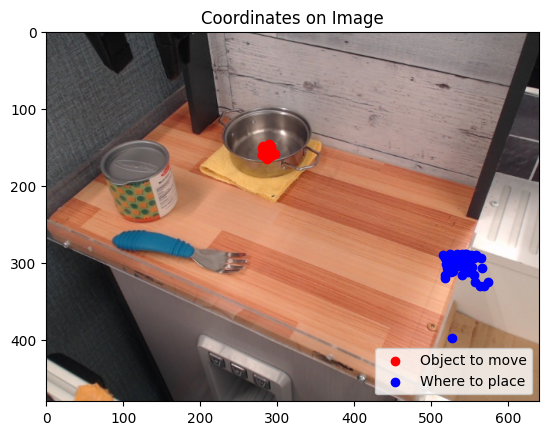

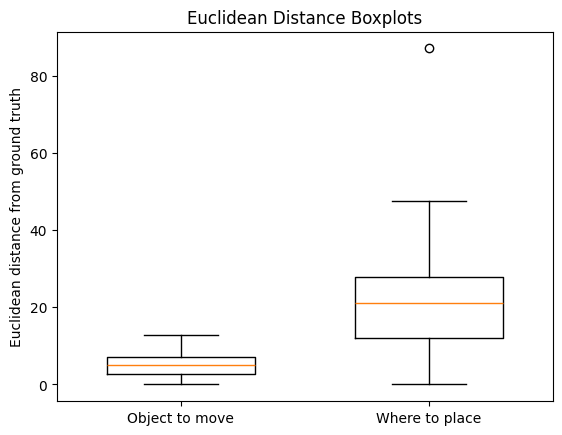

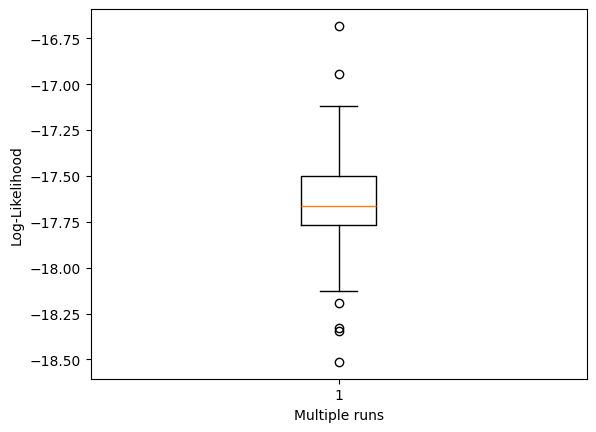

Runs with exactly two coordinates: 50




In [17]:
tasks, images = extract_tasks_and_images("./data2")

for i in range(len(tasks)):
    outputs = []
    runs_with_two_coords = 0
    image = images[i]
    task = tasks[i]
    prompt = prompt_start + task + prompts[0] + prompt_end
    print(f"Task: {task}")
    for j in range(50):
        output, log_likelihood = infer_output_and_log_likelihood(image, prompt)
        molmo_out = Molmo_out(output, log_likelihood, image.width, image.height)
        if len(molmo_out.get_coordinates()) == 2:
            outputs.append(molmo_out)
            runs_with_two_coords += 1
    
        if ((j+1) % 5) == 0: 
            print(f"Run: {j + 1} - Output: {molmo_out.get_generated_text()} - Log-Likelihood: {log_likelihood}")
    visualize_points_on_image(image, [], outputs)
    plot_euclidean_bplot(outputs)
    plot_loglikelihood_bplot(outputs, "Multiple runs")
    print(f"Runs with exactly two coordinates: {runs_with_two_coords}")
    print("")
    print("")

Task: Move the can from the top left of the burner to the bottom left of the burner
Different Prompts:
Prompt: 1 - Output:  (26.5, 27.3), (26.5, 50.0) - Log-Likelihood: -12.684030532836914
Prompt: 2 - Output:  (25.9, 28.5), (0.0, 0.0) - Log-Likelihood: -7.571014404296875


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Prompt: 3 - Output:  (27.5, 25.8), (27.5, 50.0) - Log-Likelihood: -12.4751615524292


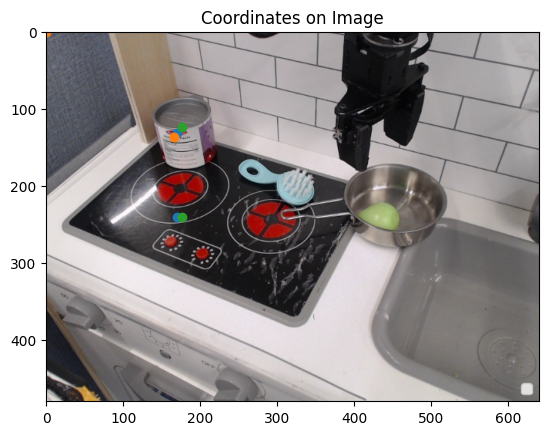

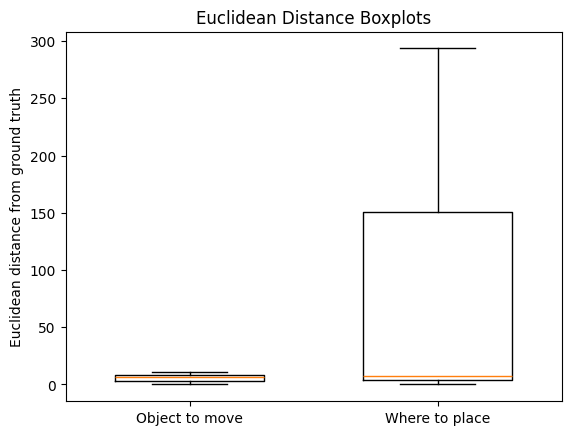

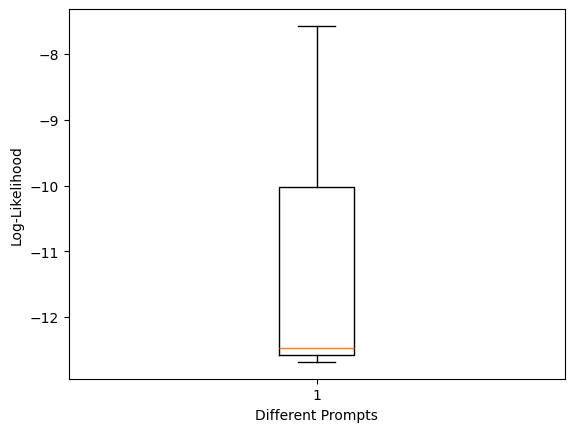



Multiple runs:
Run: 1 - Output:  (27.8, 28.6), (28.6, 55.5) - Log-Likelihood: -14.527647018432617
Run: 2 - Output:  (26.5, 28.4), (26.5, 51.3) - Log-Likelihood: -13.296246528625488
Run: 3 - Output:  (27.3, 27.3), (27.3, 50.0) - Log-Likelihood: -12.042753219604492


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Run: 4 - Output:  (27.1, 27.1), (27.1, 50.0) - Log-Likelihood: -12.203433990478516


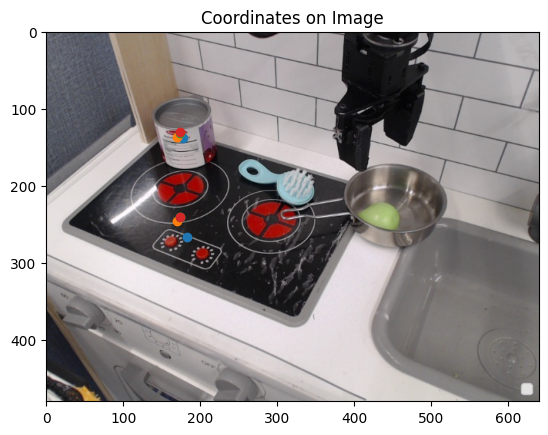

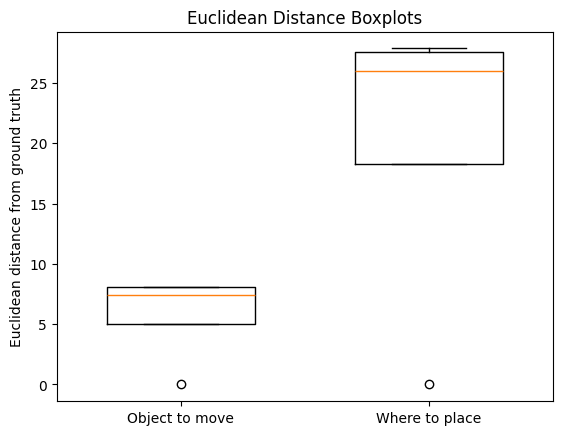

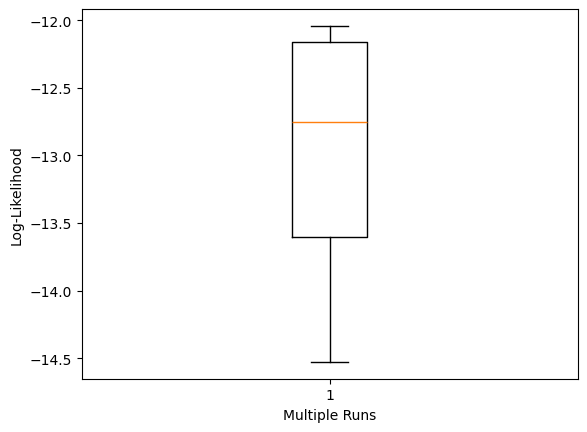



Testing different Temperatures:
Temperature: 0.3 - Output:  (27.2, 26.8), (27.2, 50.2) - Log-Likelihood: -12.820345878601074
Temperature: 0.4 - Output:  (26.6, 28.3), (28.9, 57.9) - Log-Likelihood: -14.690384864807129
Temperature: 0.6 - Output:  (27.2, 26.8), (28.8, 50.2) - Log-Likelihood: -14.919357299804688


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Temperature: 0.7 - Output:  (27.5, 28.0), (29.0, 51.3) - Log-Likelihood: -14.760683059692383


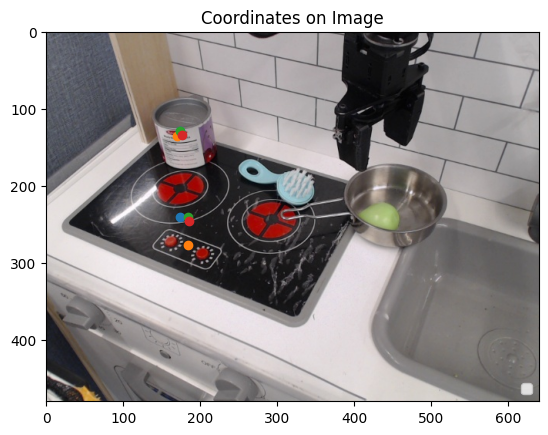

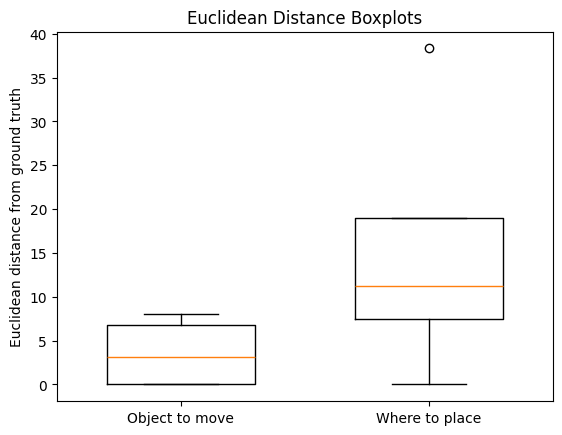

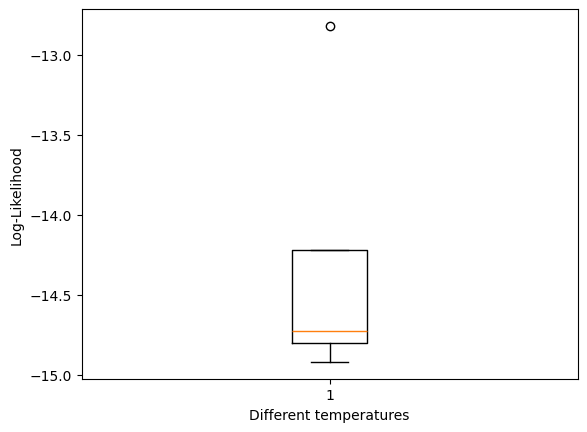



Task: pick up red srewdriver
Different Prompts:
Prompt: 1 - Output:  (47.6, 41.7), (50.1, 36.3) - Log-Likelihood: -20.642215728759766
Prompt: 2 - Output:  (26.5, 40.6), (50.0, 50.0) - Log-Likelihood: -13.486541748046875


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Prompt: 3 - Output:  (41.4, 39.2), (54.4, 37.5) - Log-Likelihood: -19.45327377319336


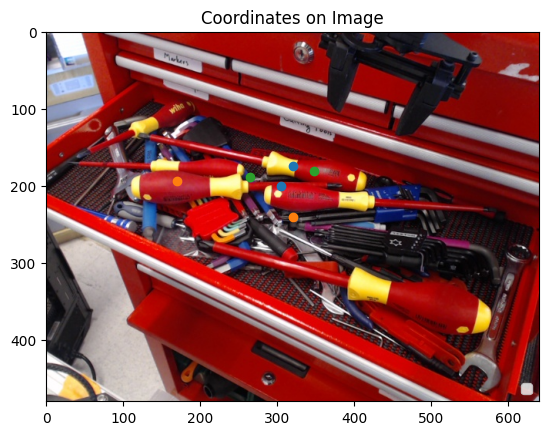

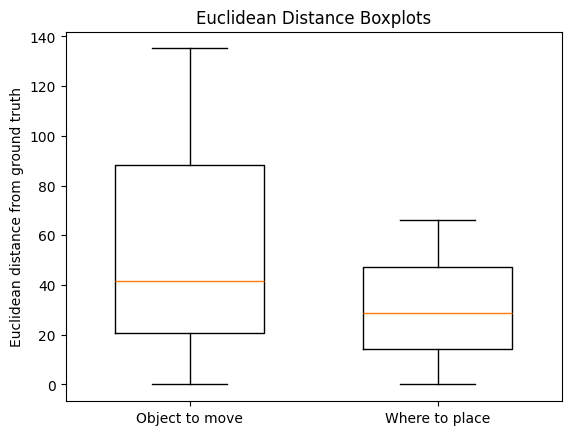

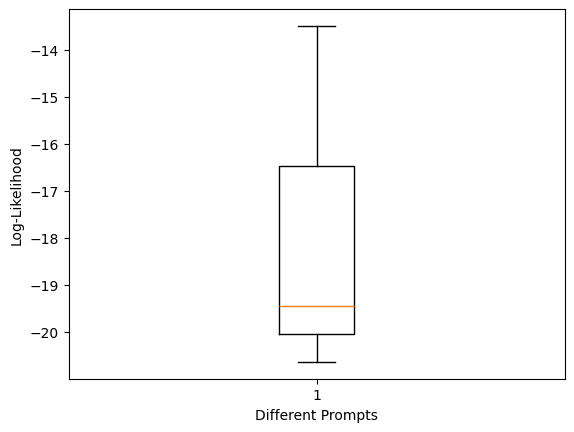



Multiple runs:
Run: 1 - Output:  (28.0, 38.9), (50.0, 50.0) - Log-Likelihood: -16.41512107849121
Run: 2 - Output:  (36.0, 39.1), (78.0, 73.9) - Log-Likelihood: -21.056243896484375
Run: 3 - Output:  (25.7, 39.4), (55.5, 44.4) - Log-Likelihood: -21.58611297607422


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Run: 4 - Output:  (41.1, 38.5), (71.7, 39.8) - Log-Likelihood: -20.45146942138672


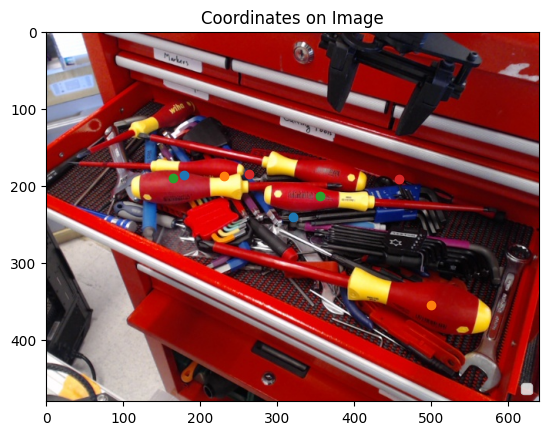

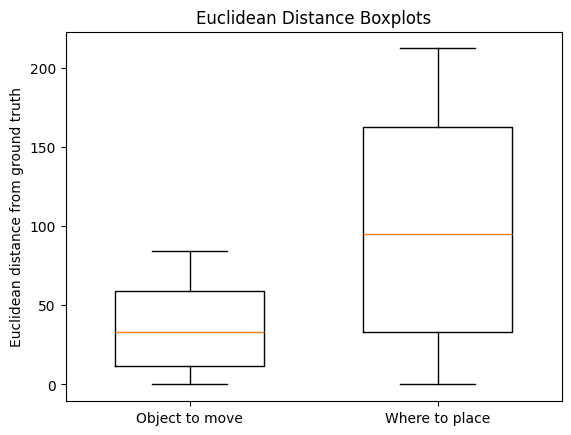

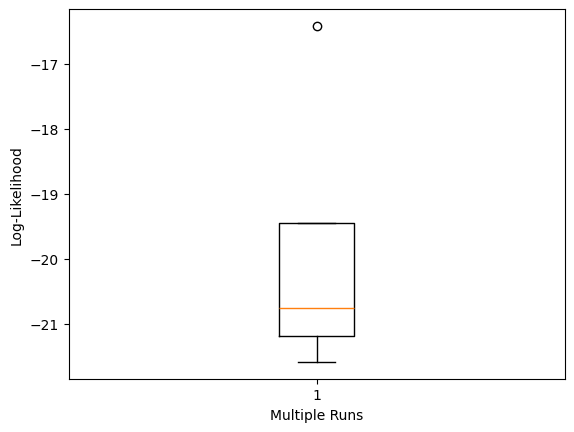



Testing different Temperatures:
Temperature: 0.3 - Output:  (35.8, 39.0), (56.1, 28.7) - Log-Likelihood: -20.59193229675293
Temperature: 0.4 - Output:  (40.1, 39.5), (50.2, 29.5) - Log-Likelihood: -19.77297592163086
Temperature: 0.6 - Output:  (38.7, 40.6), (75.5, 71.8) - Log-Likelihood: -20.861446380615234


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Temperature: 0.7 - Output:  (46.8, 38.8), (72.7, 39.8) - Log-Likelihood: -20.828022003173828


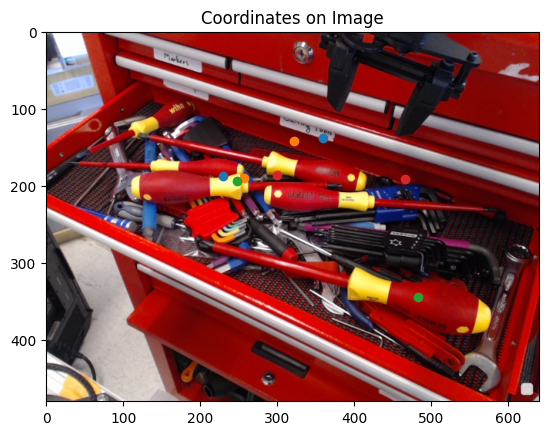

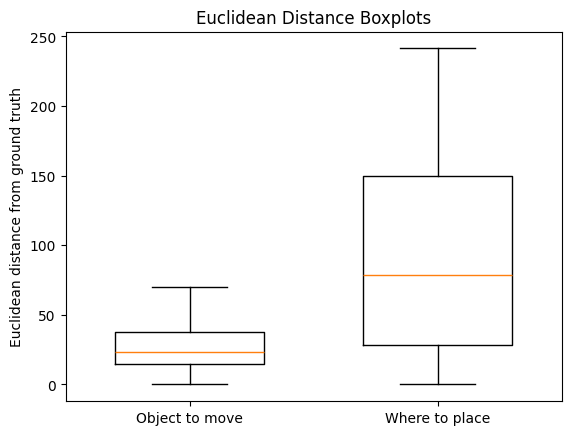

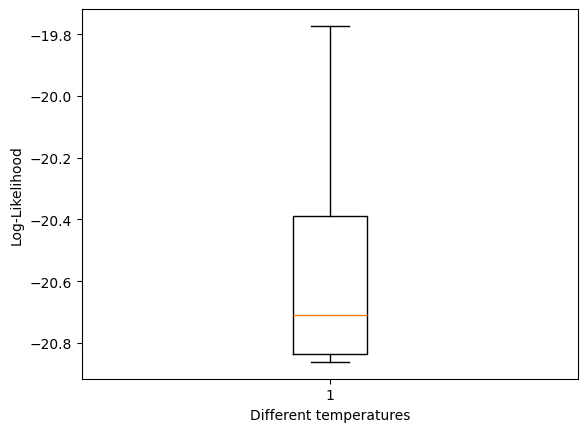



Task: take the eggplant and put it between the two right burners
Different Prompts:
Prompt: 1 - Output:  (47.5, 41.9), (59.6, 50.6) - Log-Likelihood: -16.27025604248047
Prompt: 2 - Output:  (49.8, 47.0), (0.0, 0.0) - Log-Likelihood: -10.158105850219727


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Prompt: 3 - Output:  (48.0, 41.8), (58.6, 50.3) - Log-Likelihood: -16.058366775512695


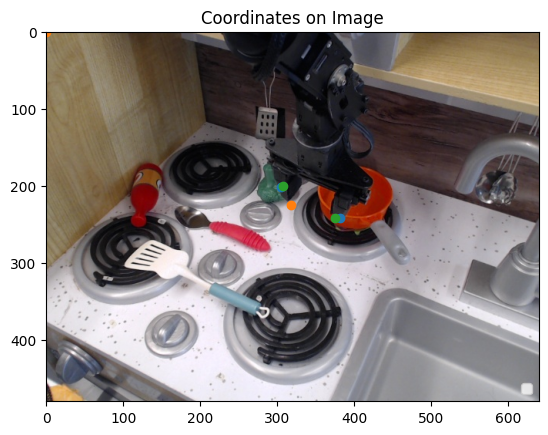

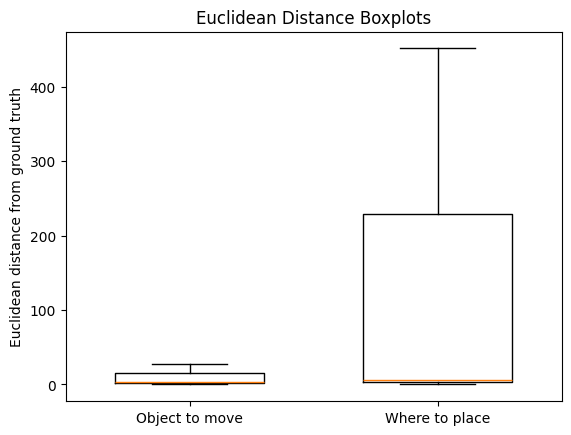

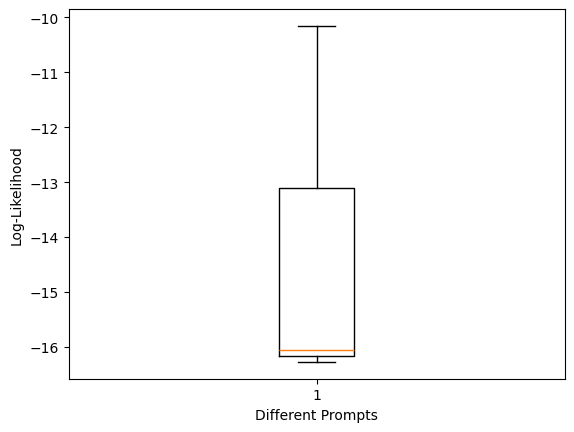



Multiple runs:
Run: 1 - Output:  (59.7, 45.1), (61.2, 51.8) - Log-Likelihood: -17.54604148864746
Run: 2 - Output:  (59.5, 47.5), (59.5, 54.4) - Log-Likelihood: -14.538204193115234
Run: 3 - Output:  (59.8, 47.1), (59.8, 55.0) - Log-Likelihood: -13.826751708984375


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Run: 4 - Output:  (58.3, 46.1), (62.2, 51.0) - Log-Likelihood: -17.828750610351562


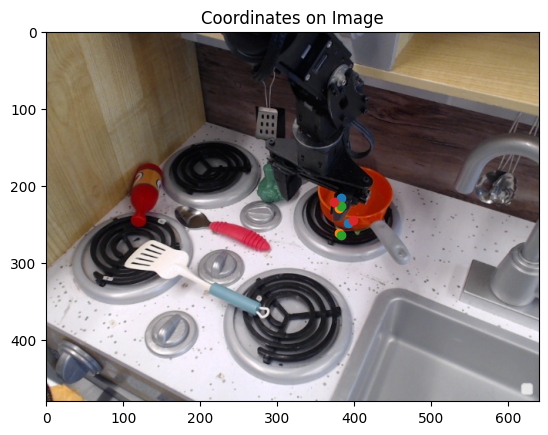

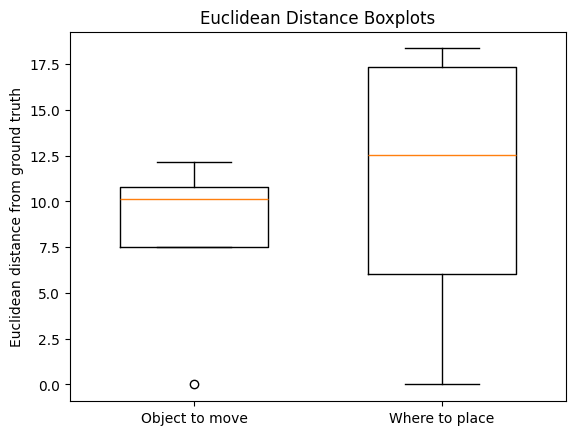

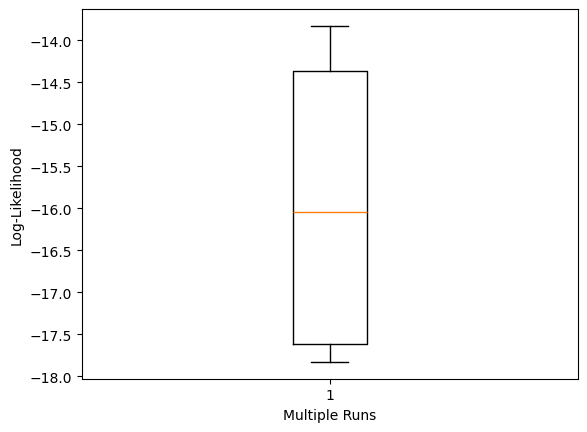



Testing different Temperatures:
Temperature: 0.3 - Output:  (44.5, 49.5), (61.2, 51.5) - Log-Likelihood: -17.33564567565918
Temperature: 0.4 - Output:  (42.1, 49.5), (59.5, 53.6) - Log-Likelihood: -17.020841598510742
Temperature: 0.6 - Output:  (49.2, 41.4), (59.7, 51.2) - Log-Likelihood: -16.15574836730957


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Temperature: 0.7 - Output:  (51.6, 46.8), (60.8, 50.4) - Log-Likelihood: -17.488122940063477


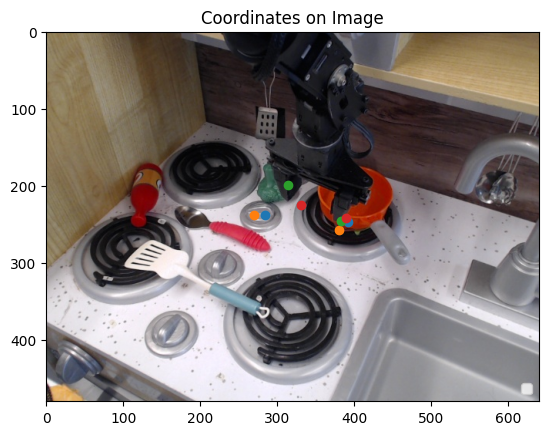

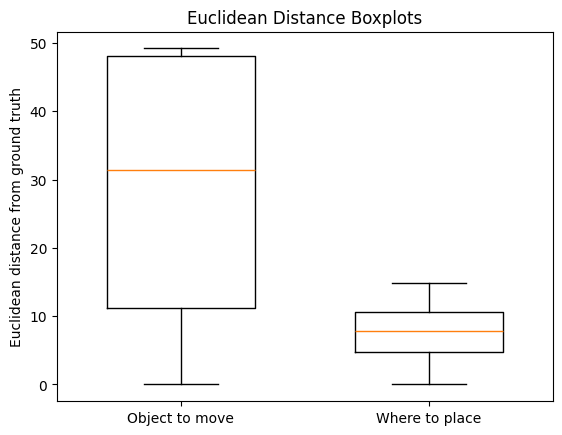

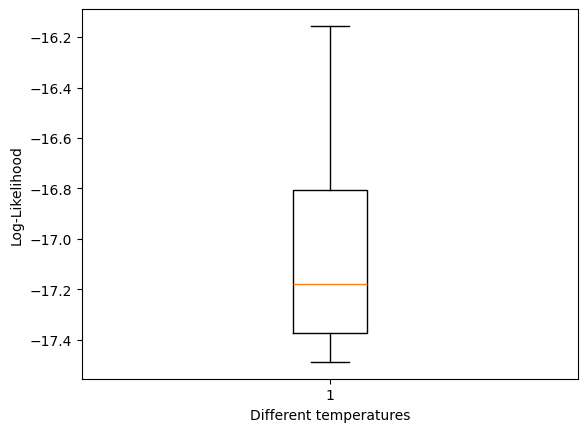



Task: move arch on the table and place it on top of another arch
Different Prompts:
Prompt: 1 - Output:  (41.1, 72.5), (69.3, 77.7) - Log-Likelihood: -17.777502059936523
Prompt: 2 - Output:  (41.0, 69.5), (41.0, 72.4), (57.7, 71.6), (58.4, 74.9) - Log-Likelihood: -36.52770233154297


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Prompt: 3 - Output:  (40.7, 74.5), (44.6, 64.0) - Log-Likelihood: -18.112363815307617


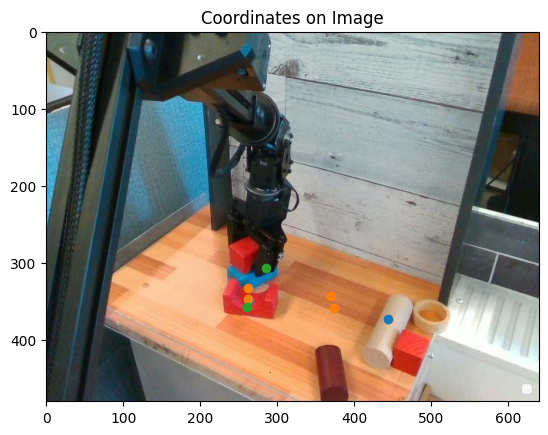

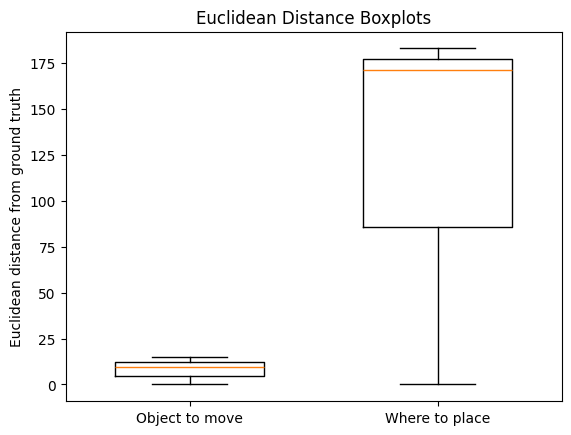

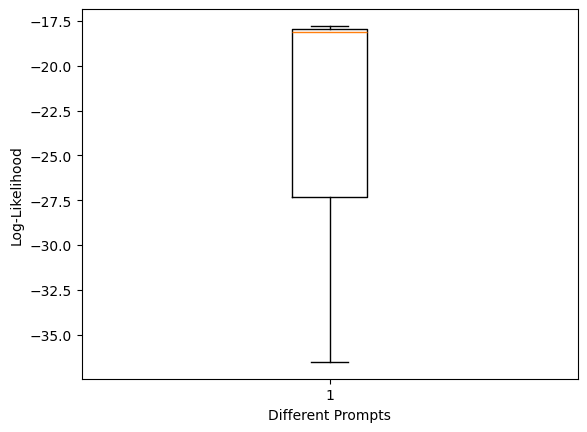



Multiple runs:
Run: 1 - Output:  (40.0, 73.5), (69.0, 78.4) - Log-Likelihood: -18.331357955932617
Run: 2 - Output:  (45.1, 68.8), (71.2, 75.8) - Log-Likelihood: -18.77459716796875
Run: 3 - Output:  (41.5, 74.7), (70.3, 73.3) - Log-Likelihood: -18.124446868896484


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Run: 4 - Output:  (40.8, 74.2), (69.9, 75.0) - Log-Likelihood: -17.89571189880371


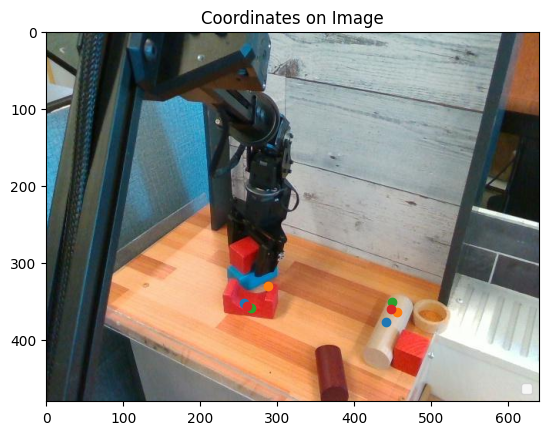

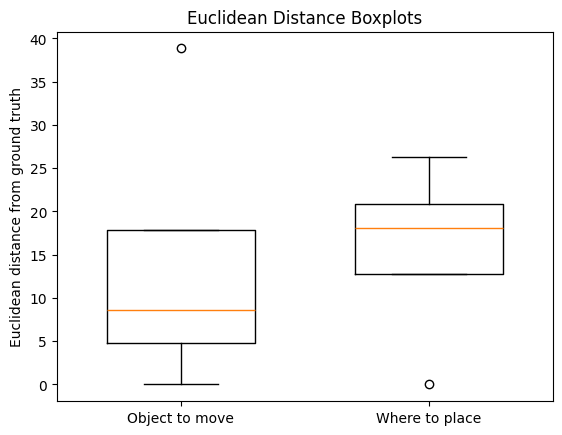

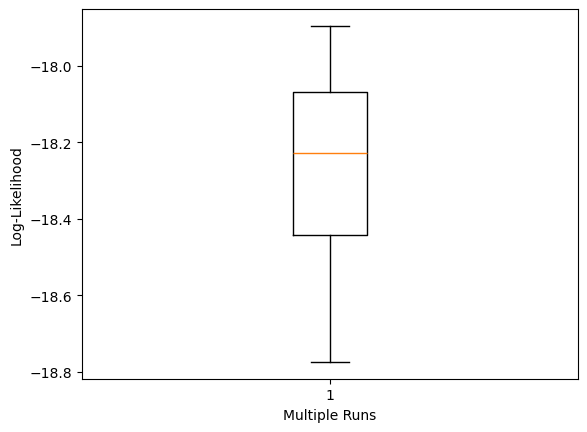



Testing different Temperatures:
Temperature: 0.3 - Output:  (41.0, 74.0), (70.5, 75.4) - Log-Likelihood: -18.080944061279297
Temperature: 0.4 - Output:  (40.4, 68.6), (70.1, 72.5) - Log-Likelihood: -18.35708999633789
Temperature: 0.6 - Output:  (69.5, 77.4), (69.9, 86.7) - Log-Likelihood: -14.753328323364258


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Temperature: 0.7 - Output:  (49.7, 65.4), (59.3, 73.1) - Log-Likelihood: -19.563156127929688


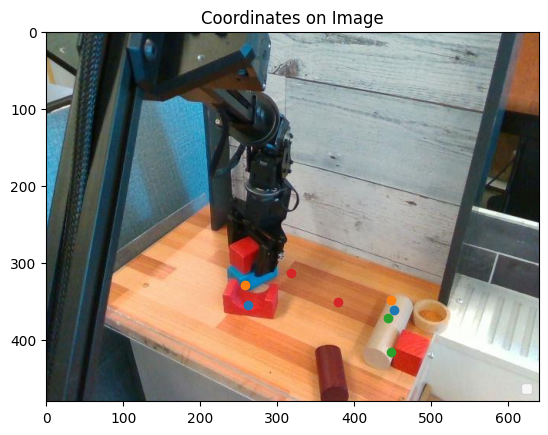

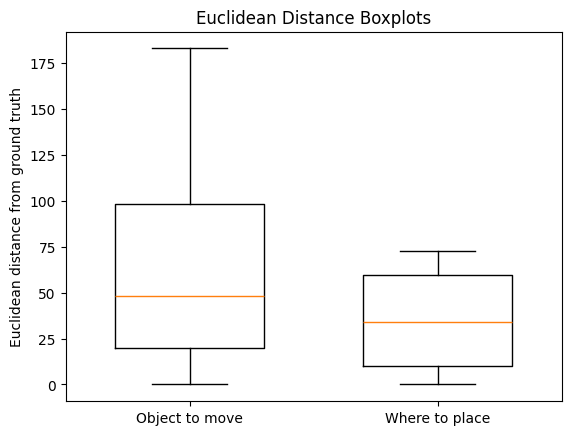

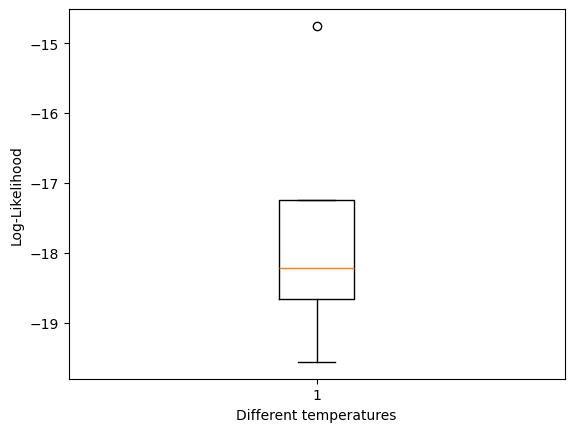



Task: take sushi out of pan
Different Prompts:
Prompt: 1 - Output:  (32.4, 24.0), (36.5, 32.0) - Log-Likelihood: -15.912442207336426
Prompt: 2 - Output:  (29.5, 24.4), (0.0, 0.0) - Log-Likelihood: -7.79393196105957


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Prompt: 3 - Output:  (30.5, 23.8), (33.5, 20.4) - Log-Likelihood: -15.87576675415039


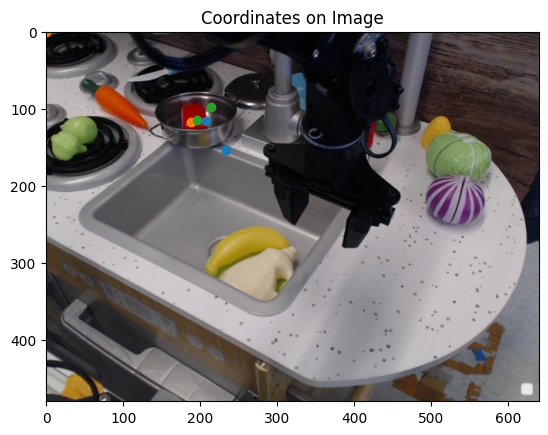

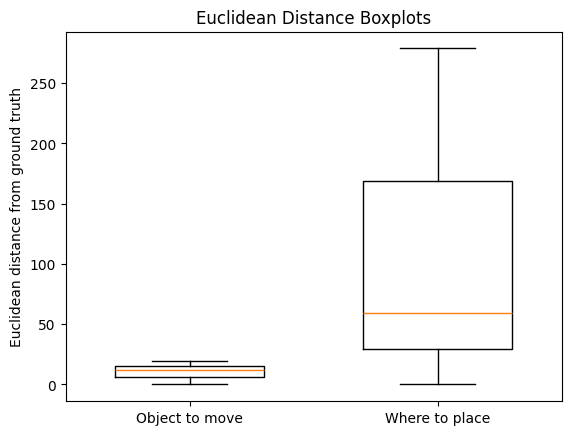

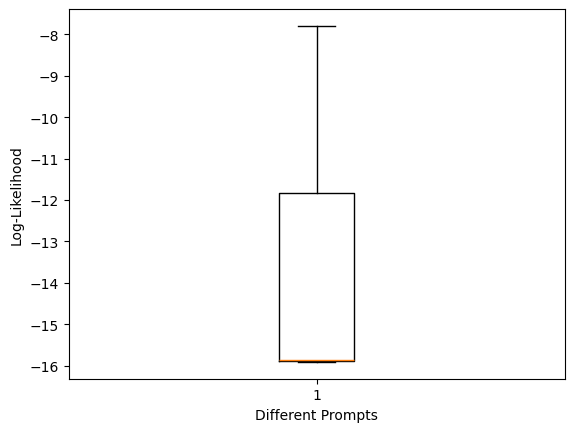



Multiple runs:
Run: 1 - Output:  (30.7, 24.2), (33.5, 20.5) - Log-Likelihood: -16.32717514038086
Run: 2 - Output:  (31.2, 23.5), (31.2, 28.3) - Log-Likelihood: -15.062978744506836
Run: 3 - Output:  (31.5, 23.0), (31.5, 26.0) - Log-Likelihood: -14.975936889648438


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Run: 4 - Output:  (31.0, 23.8), (31.0, 27.1) - Log-Likelihood: -15.382331848144531


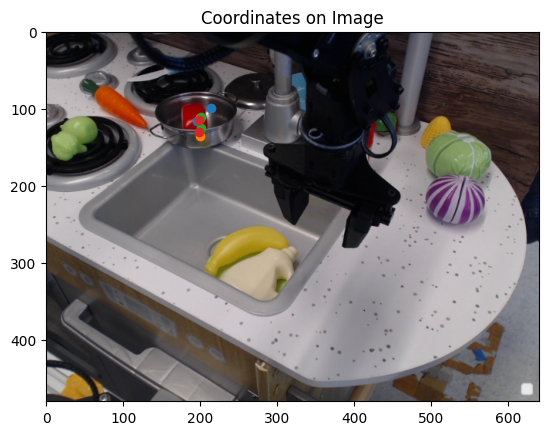

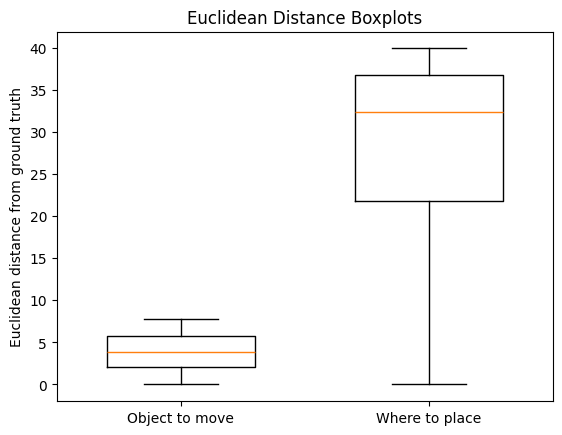

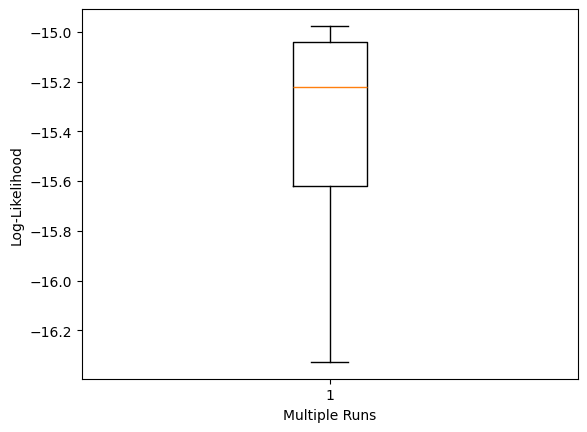



Testing different Temperatures:
Temperature: 0.3 - Output:  (33.5, 24.4), (34.4, 20.1), (41.1, 57.3), (44.0, 64.2) - Log-Likelihood: -33.83894348144531
Temperature: 0.4 - Output:  (30.6, 24.2), (31.5, 20.7) - Log-Likelihood: -16.679122924804688
Temperature: 0.6 - Output:  (29.4, 24.4), (37.9, 59.2) - Log-Likelihood: -15.518739700317383


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Temperature: 0.7 - Output:  (31.7, 22.0), (36.3, 19.9) - Log-Likelihood: -16.75524139404297


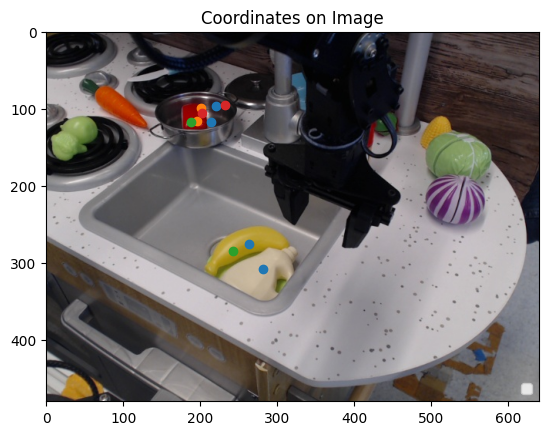

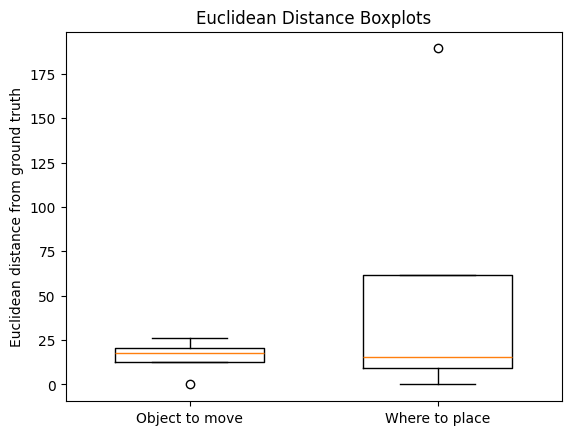

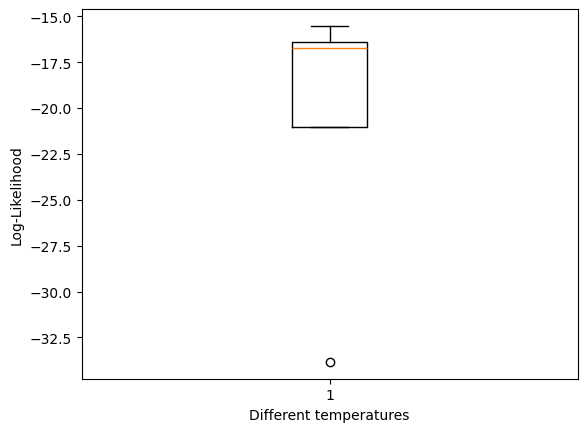



Task: pick up glass cup
Different Prompts:
Prompt: 1 - Output:  (39.1, 63.0), (50.5, 43.0) - Log-Likelihood: -16.61667251586914
Prompt: 2 - Output:  (39.2, 61.5), (51.2, 40.2) - Log-Likelihood: -17.18492317199707


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Prompt: 3 - Output:  (42.4, 59.1), (54.0, 38.9) - Log-Likelihood: -16.932830810546875


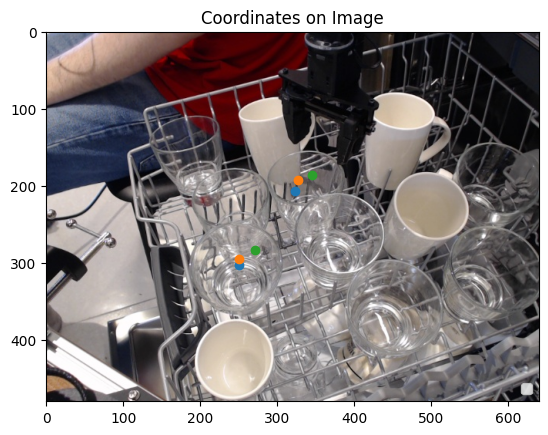

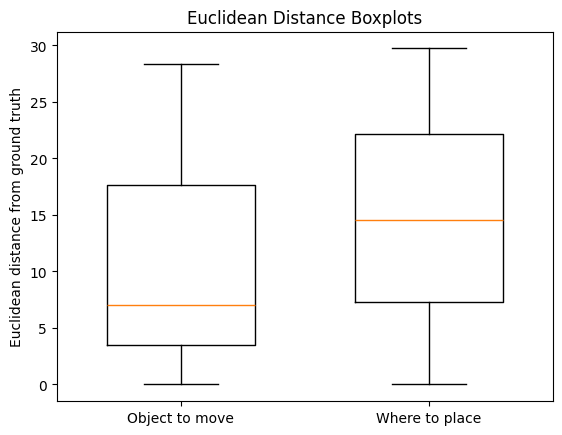

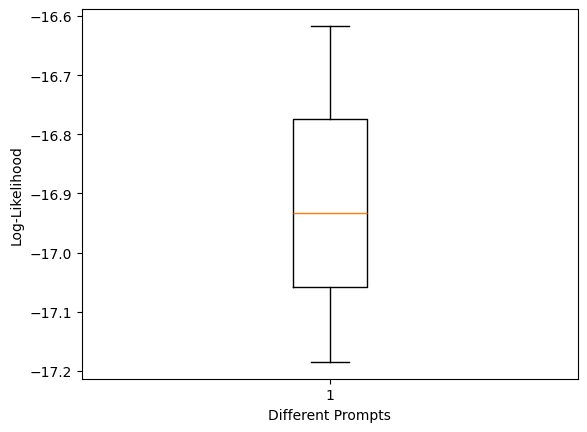



Multiple runs:
Run: 1 - Output:  (39.6, 61.7), (50.0, 40.7) - Log-Likelihood: -16.827943801879883
Run: 2 - Output:  (40.0, 59.5), (50.0, 40.0) - Log-Likelihood: -13.501605987548828
Run: 3 - Output:  (41.2, 59.8), (51.4, 38.0) - Log-Likelihood: -17.115297317504883


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Run: 4 - Output:  (40.1, 62.1), (50.0, 40.1) - Log-Likelihood: -16.52153205871582


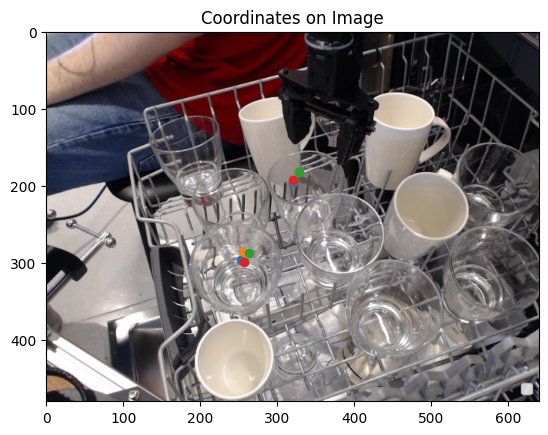

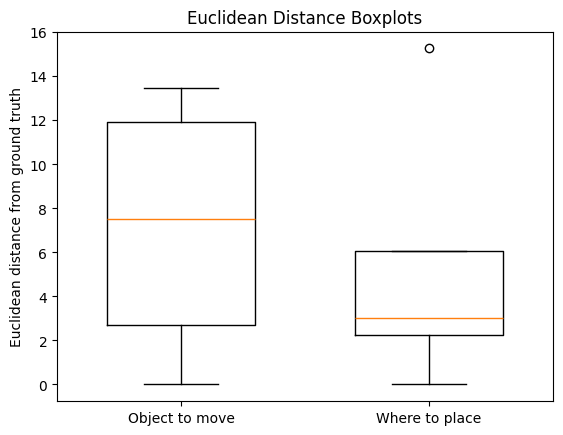

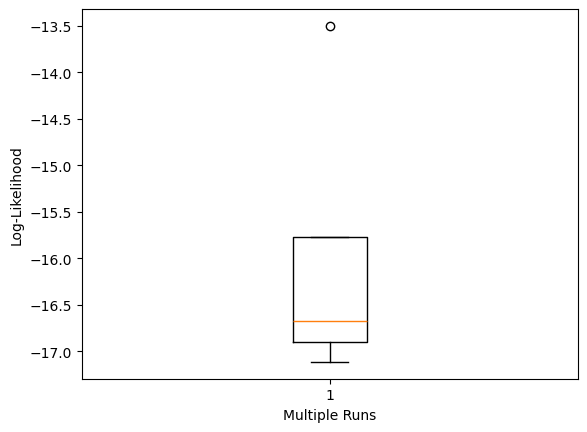



Testing different Temperatures:
Temperature: 0.3 - Output:  (41.0, 60.8), (50.0, 40.8) - Log-Likelihood: -16.471466064453125
Temperature: 0.4 - Output:  (39.5, 61.9), (54.7, 39.0) - Log-Likelihood: -16.840604782104492
Temperature: 0.6 - Output:  (37.9, 55.1), (51.2, 37.6) - Log-Likelihood: -16.395639419555664


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Temperature: 0.7 - Output:  (53.3, 40.3), (68.9, 74.4) - Log-Likelihood: -17.46625328063965


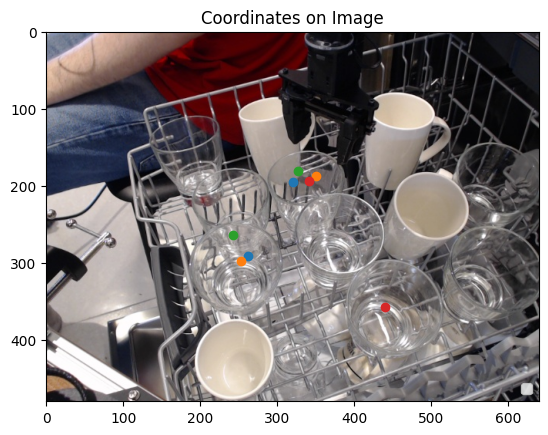

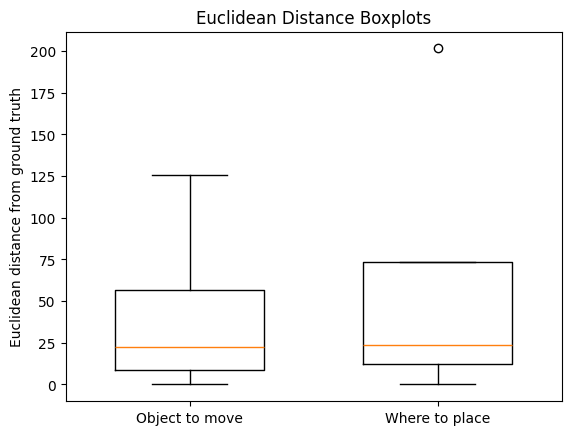

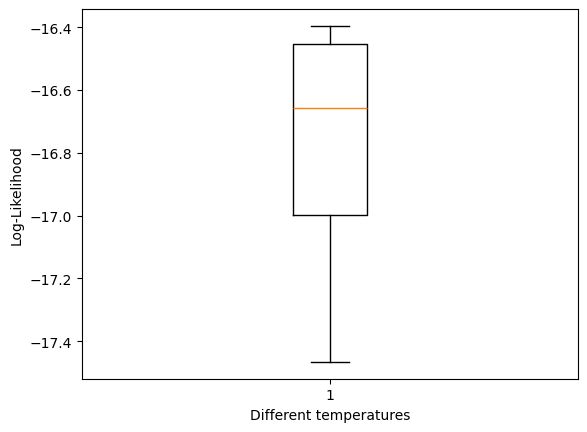



Task: open low fridge
Different Prompts:
Prompt: 1 - Output:  (57.8, 63.1), (58.1, 46.2) - Log-Likelihood: -19.140579223632812
Prompt: 2 - Output:  (0.0, 0.0), (0.0, 0.0) - Log-Likelihood: -1.80472731590271


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Prompt: 3 - Output:  (58.2, 60.5), (58.2, 79.6) - Log-Likelihood: -17.39701271057129


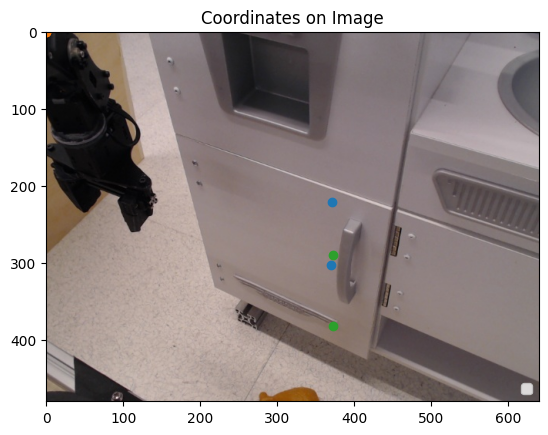

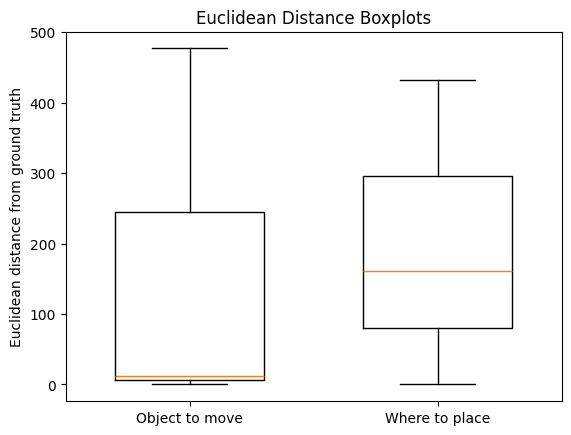

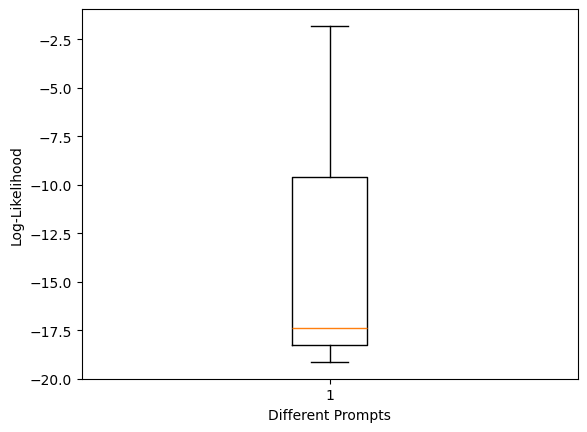



Multiple runs:
Run: 1 - Output:  (59.5, 60.0), (59.5, 75.0) - Log-Likelihood: -16.460390090942383
Run: 2 - Output:  (59.0, 58.0), (59.0, 58.0) - Log-Likelihood: -13.191741943359375
Run: 3 - Output:  (59.5, 61.7), (59.5, 75.5) - Log-Likelihood: -16.853160858154297


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Run: 4 - Output:  (59.1, 60.0), (59.1, 60.0) - Log-Likelihood: -13.820388793945312


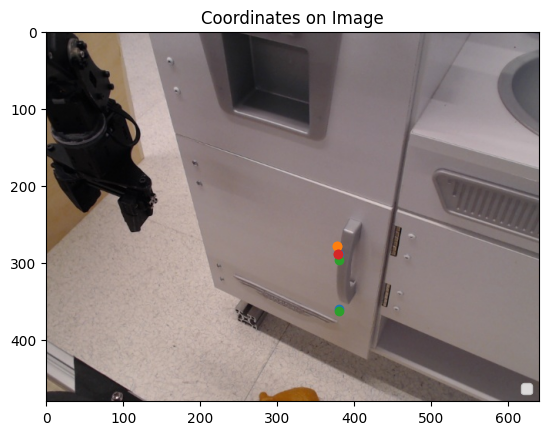

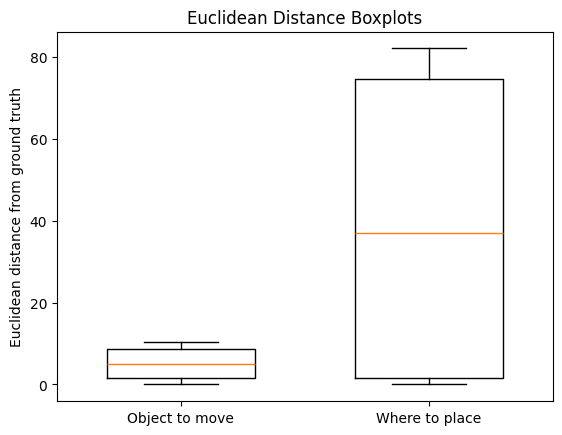

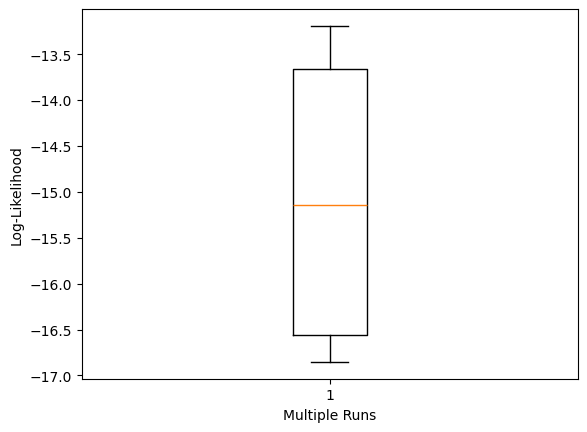



Testing different Temperatures:
Temperature: 0.3 - Output:  (59.6, 63.0), (59.6, 78.6) - Log-Likelihood: -16.654525756835938
Temperature: 0.4 - Output:  (60.0, 59.0), (50.0, 40.0) - Log-Likelihood: -12.534037590026855
Temperature: 0.6 - Output:  (59.4, 59.7), (49.2, 47.8) - Log-Likelihood: -18.98294448852539


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Temperature: 0.7 - Output:  (61.5, 57.4), (42.4, 32.8) - Log-Likelihood: -18.298805236816406


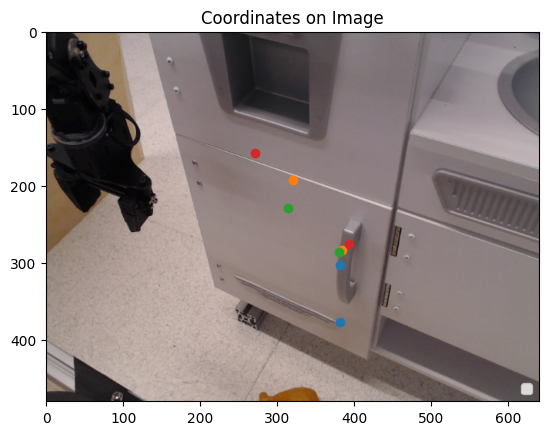

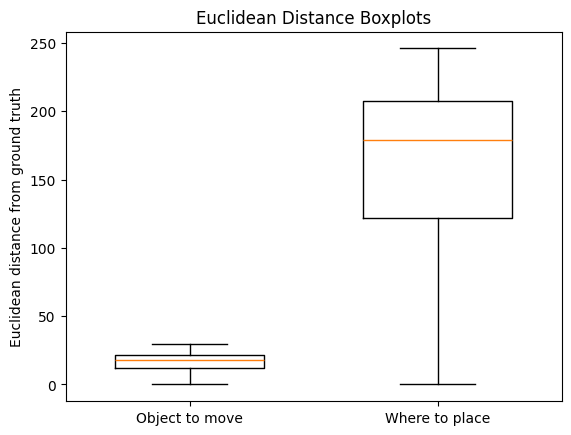

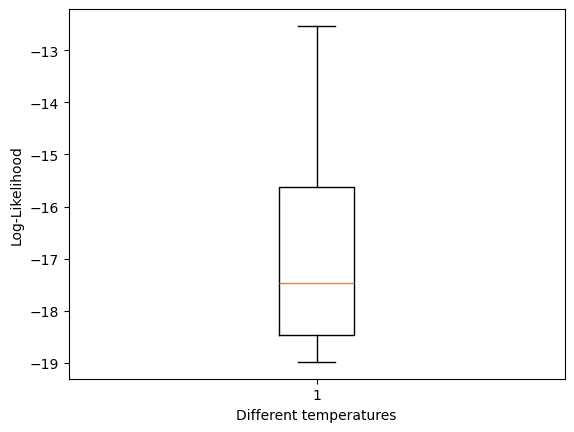



Task: Place the pot to the right of the blue fork.
Move silver pot to lower right corner of the table.
Different Prompts:
Prompt: 1 - Output:  (45.5, 35.7), (80.5, 60.0) - Log-Likelihood: -16.6741943359375
Prompt: 2 - Output:  (45.7, 34.6), (0.0, 0.0) - Log-Likelihood: -9.195741653442383


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Prompt: 3 - Output:  (45.0, 32.9), (82.0, 62.5) - Log-Likelihood: -17.049959182739258


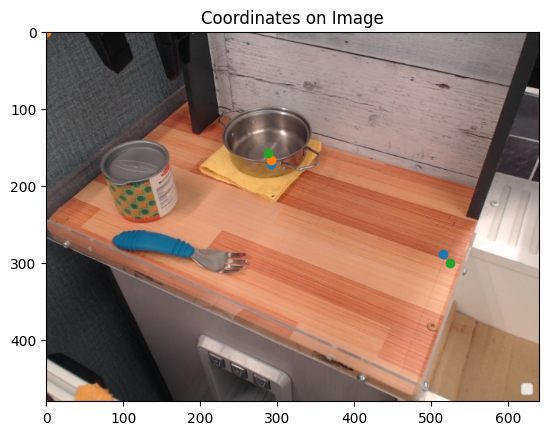

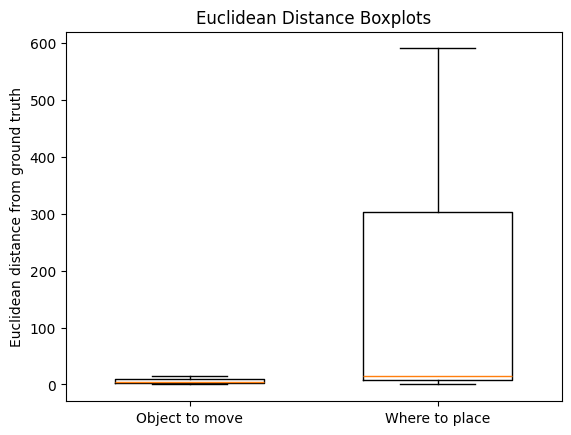

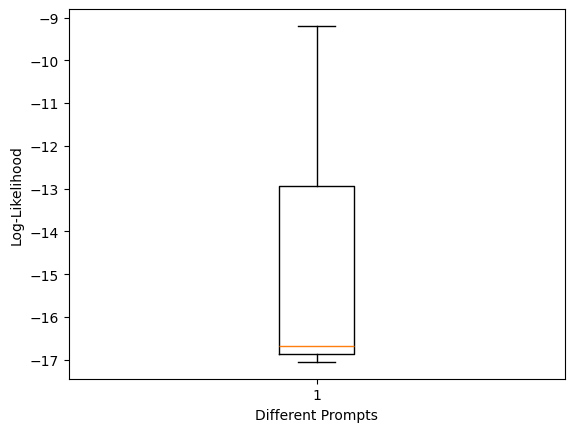



Multiple runs:
Run: 1 - Output:  (45.2, 32.1), (85.7, 63.3) - Log-Likelihood: -17.73556900024414
Run: 2 - Output:  (45.9, 32.1), (84.6, 60.1) - Log-Likelihood: -17.86261558532715
Run: 3 - Output:  (45.0, 32.2), (86.5, 60.4) - Log-Likelihood: -17.35334014892578


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Run: 4 - Output:  (45.7, 30.9), (85.1, 61.1) - Log-Likelihood: -17.65068817138672


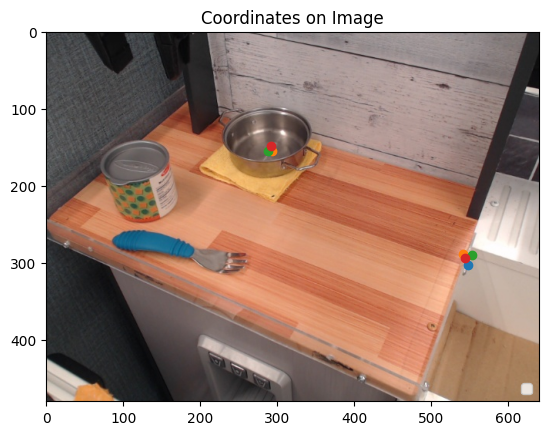

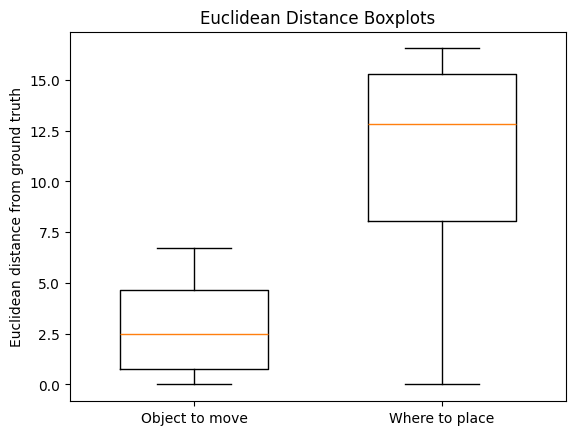

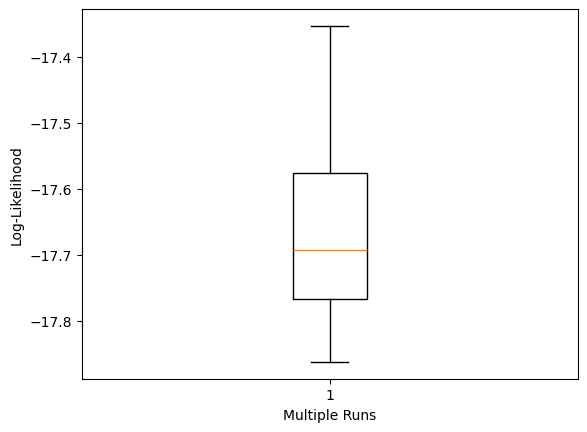



Testing different Temperatures:


KeyboardInterrupt: 

In [39]:
"""
Das ist mein Script, dass die Experimente ausführt
Für alle tasks 3 mal das gleiche: 1. Für verschiedene prompts, 2. Für das gleiche prompt und gleiche temperature, 3. Für verschiedene temperatures 
"""

#tasks, images = extract_tasks_and_images("./data")
tasks, images = extract_tasks_and_images("./data2")

for i in range(len(tasks)):
    image = images[i]
    task = tasks[i]
    print(f"Task: {task}")

    labels = []
    outputs = []
    print("Different Prompts:")
    for j in range(len(prompts)):
        labels.append(f"Prompt: {j + 1}")
        prompt = prompt_start + task + prompts[j] + prompt_end
        
        
        output, log_likelihood = infer_output_and_log_likelihood(image, prompt)
        molmo_out = Molmo_out(output, log_likelihood, image.width, image.height)
        outputs.append(molmo_out)
    
        print(f"Prompt: {j + 1} - Output: {molmo_out.get_generated_text()} - Log-Likelihood: {log_likelihood}")

    
    visualize_points_on_image(image, labels, outputs)
    plot_euclidean_bplot(outputs)
    plot_loglikelihood_bplot(outputs, "Different Prompts")
    print("")
    print("")

    prompt = prompt_start + task + prompts[0] + prompt_end
    labels = []
    outputs = []
    print("Multiple runs:")
    for j in range(4):
        labels.append(f"Run: {j + 1}")
        
        output, log_likelihood = infer_output_and_log_likelihood(image, prompt)
        molmo_out = Molmo_out(output, log_likelihood, image.width, image.height)
        outputs.append(molmo_out)
    
        print(f"Run: {j + 1} - Output: {molmo_out.get_generated_text()} - Log-Likelihood: {log_likelihood}")

    visualize_points_on_image(image, labels, outputs)
    plot_euclidean_bplot(outputs)
    plot_loglikelihood_bplot(outputs, "Multiple Runs")
    print("")
    print("")

    labels = []
    outputs = []
    print("Testing different Temperatures:")
    for j in range(len(temperatures)):
        temp = temperatures[j]
        labels.append(f"temp: {temp}")
        
        output, log_likelihood = infer_output_and_log_likelihood(image, prompt, temp)
        molmo_out = Molmo_out(output, log_likelihood, image.width, image.height)
        outputs.append(molmo_out)
    
        print(f"Temperature: {temp} - Output: {molmo_out.get_generated_text()} - Log-Likelihood: {log_likelihood}")

    visualize_points_on_image(image, labels, outputs)
    plot_euclidean_bplot(outputs)
    plot_loglikelihood_bplot(outputs, "Different temperatures")
    print("")
    print("")

# Unused Stuff

In [42]:
tasks, images = extract_tasks_and_images("./data2")

inputs = processor.process(
    images=images[0],
    text=prompt_start + tasks[0] + prompts[0] + prompt_end
)
print(tasks[0])
inputs = {k: v.to(model.device).unsqueeze(0) for k, v in inputs.items()}

# Generate output and compute logits
with torch.autocast(device_type="cuda", enabled=True, dtype=torch.bfloat16):
    # Generate output
    output = model.generate_from_batch(
        inputs,
        GenerationConfig(max_new_tokens=200, stop_strings="<|endoftext|>", temperature=0.2, do_sample=True),
        tokenizer=processor.tokenizer,
        return_dict_in_generate=True,
        output_logits=True
    )

    print(f"All Token length: {output.sequences.shape}")

    output_text = generate_output_text(output, inputs)
    log_likelihood = generate_log_likelihood(output)

    print(output_text)
    print(log_likelihood)

    """
    logits = output.logits # Logits for each generation step
    logits = torch.cat(logits, dim=0)
    print(f"Shape of logits: {logits.shape}")

    output_tokens = output.sequences[0, inputs['input_ids'].size(1):]
    for i in range(len(output_tokens)):
        log = logits[i]
        softmax_fn = torch.nn.Softmax(dim=-1)

        logit_probs = softmax_fn(log)
        highest_probs, _ = torch.max(logit_probs, dim=-1)
        print(f"Char: {processor.tokenizer.decode(output_tokens[i], skip_special_tokens=False)} - {highest_probs}")# Generated token ID

    
    for i in range(len(output_tokens)):
        if output_tokens[i] == 320 or output_tokens[i] == 11 or output_tokens[i] == 13 or output_tokens[i] == 701 or output_tokens[i] == 8:
            log = logits[i]
            softmax_fn = torch.nn.Softmax(dim=-1)

            logit_probs = softmax_fn(log)
            highest_probs, _ = torch.max(logit_probs, dim=-1)
            print(f"Char: {processor.tokenizer.decode(output_tokens[i], skip_special_tokens=False)} - Highest Prob: {highest_probs}")# Generated token ID
            #output_log_probs = torch.log(highest_probs)
            #print(f"Token {i}:{output_tokens[i]}")
    
    
    # Decode the full text
    generated_text = processor.tokenizer.decode(token_ids, skip_special_tokens=True)
    print(f"Generated text:\n{generated_text}")
    """

Move the can from the top left of the burner to the bottom left of the burner
All Token length: torch.Size([1, 902])
Output Token length: 25
Tokens: tensor([   320,     17,     23,     13,     16,     11,    220,     17,     22,
            13,     17,    701,    320,     17,     23,     13,     16,     11,
           220,     20,     16,     13,     17,      8, 151643],
       device='cuda:0')
used logits: 25
 (28.1, 27.2), (28.1, 51.2)
-13.172130584716797


In [18]:
for experiment in os.listdir("./data2"):
    if experiment.startswith("."):
        continue
    subdir_path = os.path.join("./data2", experiment)
    task_file_path = os.path.join(subdir_path, "lang.txt")

    # Get image
    for file in os.listdir(subdir_path):
                if file.startswith("im_") and file.endswith((".png", ".jpg", ".jpeg")):
                    image_path = os.path.join(subdir_path, file)
                    image = Image.open(image_path)
                    image.close()

In [12]:
def group_objects(objects):

    most_objects = 0
    for run in objects:
        most_objects = max(most_objects, len(run))

    grouped_objects = []
    ground_truthes = []
    labels = []

    for i in range(most_objects):
        object_coordinates = []
        for run in objects:
            if i < len(run):
                object = run[i]
                object_coordinates.append((object[1], object[2]))
        grouped_objects.append(object_coordinates)
        ground_truthes.append(object_coordinates[0])


    return grouped_objects, ground_truthes

In [ ]:
for i in range(len(tasks)):
    print(f"Task: {task}")
    image = images[i]
    task = tasks[i]
    
    labels = []
    outputs = []
    print("Different Prompts:")
    for j in range(len(prompts)):
        labels.append(f"Prompt: {j + 1}")
        prompt = prompt_start + task + prompts[j] + prompt_end
        
        
        output, likelihood = do_inference_and_log_likelihood(image, prompt)
        molmo_out = Molmo_out(output, image.width, image.height)
        outputs.append(molmo_out)
    
        print(f"Prompt: {j + 1} - Output: {molmo_out.get_generated_text()}")
        print(f"The log-likelihood is: {likelihood}")

    
    visualize_points_on_image(image, labels, outputs)
    print("")
    print("")